<a href="https://colab.research.google.com/github/gurmeherr/Clinical-Perturbation-Aware-Knowledge-Distillation-for-Trustworthy-Cardiac-Image-Segmentation/blob/main/RAUNet_%2B_ENet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

zip_path = '/content/drive/MyDrive/pack.zip'
extract_to = '/content/npz_dataset'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'Files extracted to: {extract_to}')

Files extracted to: /content/npz_dataset


In [ ]:
npz_directory = "/content/npz_dataset"  # Point to the extracted directory
visualization_output = "/content/visualizations"  # Save visualizations here

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from ipywidgets import interact, widgets
from IPython.display import display

npz_root = "/content/npz_dataset/pack/processed_data/ct_256/train/npz"
npz_files = sorted([f for f in os.listdir(npz_root) if f.endswith('.npz')])

# Grouping files by patients
from collections import defaultdict
patient_slices = defaultdict(list)
for f in npz_files:
    patient_id = f.split("_slice")[0]
    patient_slices[patient_id].append(f)

# Sorting slices for each patient
for pid in patient_slices:
    patient_slices[pid] = sorted(patient_slices[pid])

# Labels
label_map = {
    1: ("Left Ventricle Blood Cavity", 500),
    2: ("Right Ventricle Blood Cavity", 600),
    3: ("Left Atrium Blood Cavity", 420),
    4: ("Right Atrium Blood Cavity", 550),
    5: ("Myocardium", 205),
    6: ("Aorta", 820),
    7: ("Pulmonary Artery", 850)
}

def show_slice(patient_id, slice_idx):
    slice_file = patient_slices[patient_id][slice_idx]
    file_path = os.path.join(npz_root, slice_file)
    data = np.load(file_path)
    image, label = data['image'], data['label']

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].imshow(image, cmap='gray')
    axs[0].set_title(f"Image: {slice_file}")
    axs[0].axis('off')

    axs[1].imshow(image, cmap='gray')
    axs[1].imshow(label, cmap='nipy_spectral', alpha=0.7)
    axs[1].set_title("Segmentation Overlay")
    axs[1].axis('off')

    cmap = plt.get_cmap('nipy_spectral')
    handles = [
        Patch(facecolor=cmap(i / len(label_map)), edgecolor='black', label=name, linewidth=0.5)
        for i, (name, _) in enumerate(label_map.values(), start=1)
    ]
    fig.legend(handles=handles, loc='lower center', ncol=4, frameon=False, fontsize=9, handleheight=2, handlelength=2)

    plt.tight_layout(rect=[0, 0.1, 1, 1])
    plt.show()

# Drop down menu for each patient
patient_dropdown = widgets.Dropdown(
    options=sorted(patient_slices.keys()),
    description='Patient:',
    layout=widgets.Layout(width='40%')
)

slice_slider = widgets.IntSlider(
    value=0, min=0, max=1, step=1, description='Slice:',
    continuous_update=False, layout=widgets.Layout(width='90%')
)

def update_slice_slider_range(*args):
    patient_id = patient_dropdown.value
    slice_slider.max = len(patient_slices[patient_id]) - 1
    slice_slider.value = 0

patient_dropdown.observe(update_slice_slider_range, names='value')
update_slice_slider_range()

ui = widgets.VBox([patient_dropdown, slice_slider])
out = widgets.interactive_output(show_slice, {'patient_id': patient_dropdown, 'slice_idx': slice_slider})

display(ui, out)

Output()

In [ ]:
from torch.utils.data import Dataset
import os
import numpy as np
import torch

class StackedSliceDataset(Dataset):
    def __init__(self, npz_dir):
        self.dir = npz_dir
        self.files = sorted([f for f in os.listdir(npz_dir) if f.endswith('.npz')])
        self.paths = [os.path.join(npz_dir, f) for f in self.files]

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        paths = self.paths
        idx_prev = max(0, idx - 1)
        idx_next = min(len(paths) - 1, idx + 1)

        def load_image(path):
            return np.load(path)['image']

        prev_img = load_image(paths[idx_prev])
        curr_img = load_image(paths[idx])
        next_img = load_image(paths[idx_next])

        # Stack as 3-channel input
        stacked_img = np.stack([prev_img, curr_img, next_img], axis=0)

        stacked_img = (stacked_img - stacked_img.mean()) / (stacked_img.std() + 1e-5)

        # Label is for the center slice
        label = np.load(paths[idx])['label']

        return torch.tensor(stacked_img, dtype=torch.float32), torch.tensor(label, dtype=torch.long)

In [ ]:
import torchvision.transforms.functional as TF
import torch.nn.functional as F
import random

class AugmentedStackedDataset(StackedSliceDataset):
    def __getitem__(self, idx):
        image, label = super().__getitem__(idx)

        if random.random() > 0.5:
            factor = random.uniform(0.8, 1.0)  # brightness factor
            image = TF.adjust_brightness(image, factor)

        if random.random() > 0.5:
            factor = random.uniform(0.8, 1.0)  # contrast factor
            image = TF.adjust_contrast(image, factor)

        if torch.rand(1) > 0.5:
            image = TF.hflip(image)
            label = TF.hflip(label)

        if torch.rand(1) > 0.5:
            angle = torch.randint(-5, 5, (1,)).item()
            image = TF.rotate(image, angle)
            label = TF.rotate(label.unsqueeze(0), angle, interpolation=TF.InterpolationMode.NEAREST).squeeze(0)

                # Affine (translation + scaling, no shear for now)
        if torch.rand(1) > 0.5:
            angle = 0  # no extra rotation
            translate = (random.randint(-5, 5), random.randint(-5, 5))
            scale = random.uniform(0.95, 1.05)
            image = TF.affine(image, angle=angle, translate=translate, scale=scale, shear=0)
            label = TF.affine(label.unsqueeze(0).float(), angle=angle, translate=translate, scale=scale,
                              shear=0, interpolation=TF.InterpolationMode.NEAREST).squeeze(0).long()

        return image, label

<ipython-input-7-3466cdfcd4ce>:42: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  mpatches.Patch(


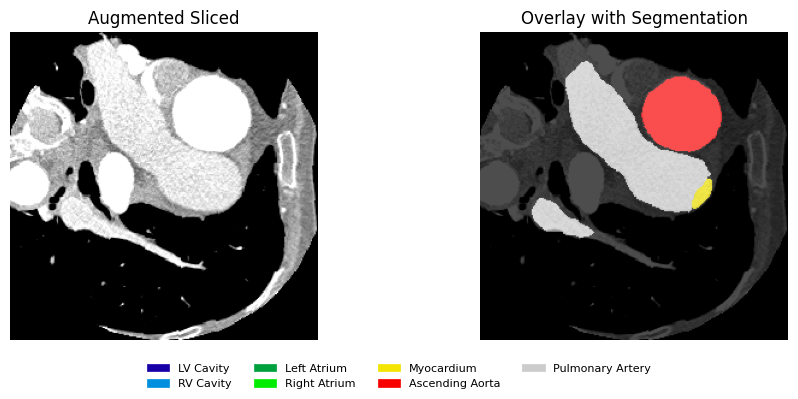

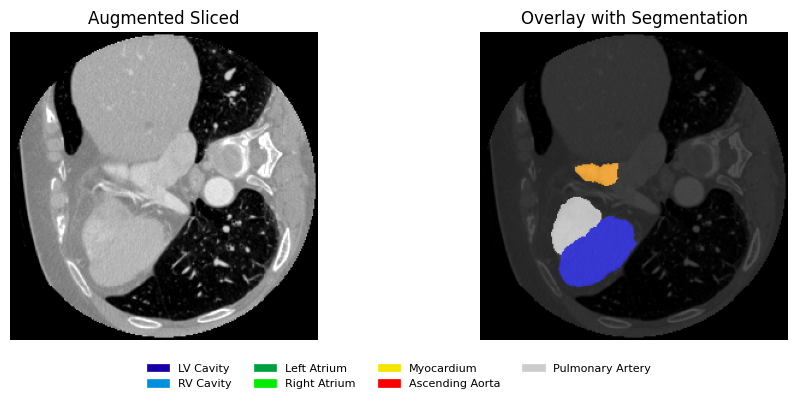

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import torch
import random
label_map = {
    1: "LV Cavity",
    2: "RV Cavity",
    3: "Left Atrium",
    4: "Right Atrium",
    5: "Myocardium",
    6: "Ascending Aorta",
    7: "Pulmonary Artery",
}

def denormalize_image(image):
    return (image - image.min()) / (image.max() - image.min() + 1e-5)

def visualize_augmented_samples(dataset, num_samples=2):
    indices = random.sample(range(len(dataset)), num_samples)

    for idx in indices:
        image_tensor, label_tensor = dataset[idx]

        image_np = image_tensor.numpy()
        label_np = label_tensor.numpy()

        center_slice = denormalize_image(image_np[1])

        fig, axs = plt.subplots(1, 2, figsize=(10, 4))
        axs[0].imshow(center_slice, cmap='gray')
        axs[0].set_title("Augmented Sliced")
        axs[0].axis('off')

        axs[1].imshow(center_slice, cmap='gray')
        axs[1].imshow(label_np, cmap='nipy_spectral', alpha=0.7)
        axs[1].set_title("Overlay with Segmentation")
        axs[1].axis('off')

        cmap = plt.get_cmap("nipy_spectral")
        handles = [
            mpatches.Patch(
                color=cmap(cls / len(label_map)),
                label=label,
                edgecolor='black',
                linewidth=0.5
            )
            for cls, label in label_map.items()
        ]
        fig.legend(handles=handles, loc='lower center', ncol=4, frameon=False, fontsize=8, handlelength=2)

        plt.tight_layout(rect=[0, 0.1, 1, 1])
        plt.show()

npz_dir = '/content/npz_dataset/pack/processed_data/ct_256/train/npz'
aug_dataset = AugmentedStackedDataset(npz_dir)
visualize_augmented_samples(aug_dataset, num_samples=2)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from torchvision.models import resnet50, ResNet50_Weights

# Decoder block
class DecoderBlockLinkNet(nn.Module):
    def __init__(self, in_channels, n_filters):
        super().__init__()
        self.gelu = nn.GELU()
        self.conv1 = nn.Conv2d(in_channels, in_channels // 4, 1)
        self.norm1 = nn.BatchNorm2d(in_channels // 4)
        self.deconv2 = nn.ConvTranspose2d(in_channels // 4, in_channels // 4, 4, 2, 1)
        self.norm2 = nn.BatchNorm2d(in_channels // 4)
        self.conv3 = nn.Conv2d(in_channels // 4, n_filters, 1)
        self.norm3 = nn.BatchNorm2d(n_filters)

    def forward(self, x):
        x = self.gelu(self.norm1(self.conv1(x)))
        x = self.gelu(self.norm2(self.deconv2(x)))
        x = self.gelu(self.norm3(self.conv3(x)))
        return x

# Augmented Attention Module (AAM)
class AAM(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.global_pooling = nn.AdaptiveAvgPool2d(1)
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 1),
            nn.BatchNorm2d(out_ch),
            nn.GELU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 1),
            nn.BatchNorm2d(out_ch),
            nn.GELU()
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 1),
            nn.Softmax(dim=1)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 1),
            nn.BatchNorm2d(out_ch),
            nn.GELU()
        )

    def forward(self, input_high, input_low):
        weight = self.conv3(self.conv1(self.global_pooling(input_high)) +
                            self.conv2(self.global_pooling(input_low)))
        return input_high + self.conv4(input_low) * weight

# RAUNet
class RAUNet(nn.Module):
    def __init__(self, num_classes=8, num_channels=1, pretrained=True):
        super().__init__()
        self.num_classes = num_classes

        # Encoder: using ResNet50 pretrained on ImageNet.
        resnet = models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
        self.firstconv = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=7, stride=2, padding=3, bias=False)
        self.firstbn = resnet.bn1

        self.firstrelu = nn.GELU()
        self.firstmaxpool = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4

        filters = [256, 512, 1024, 2048]
        # Decoder blocks
        self.decoder4 = DecoderBlockLinkNet(filters[3], filters[2])
        self.decoder3 = DecoderBlockLinkNet(filters[2], filters[1])
        self.decoder2 = DecoderBlockLinkNet(filters[1], filters[0])
        self.decoder1 = DecoderBlockLinkNet(filters[0], filters[0])

        # Original AAM modules
        self.gau3 = AAM(filters[2], filters[2])
        self.gau2 = AAM(filters[1], filters[1])
        self.gau1 = AAM(filters[0], filters[0])
        # Extra attention modules for each stage
        self.gau3_extra = AAM(filters[2], filters[2])
        self.gau2_extra = AAM(filters[1], filters[1])
        self.gau1_extra = AAM(filters[0], filters[0])

        self.refine3 = nn.Sequential(
            nn.Conv2d(filters[2], filters[2], kernel_size=3, padding=1),
            nn.BatchNorm2d(filters[2]),
            nn.GELU()
        )
        self.refine2 = nn.Sequential(
            nn.Conv2d(filters[1], filters[1], kernel_size=3, padding=1),
            nn.BatchNorm2d(filters[1]),
            nn.GELU()
        )
        self.refine1 = nn.Sequential(
            nn.Conv2d(filters[0], filters[0], kernel_size=3, padding=1),
            nn.BatchNorm2d(filters[0]),
            nn.GELU()
        )
        self.refine_final = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.GELU()
        )

        self.finaldeconv1 = nn.ConvTranspose2d(filters[0], 32, 3, stride=2)
        self.finalrelu1 = nn.GELU()
        self.finalconv2 = nn.Conv2d(32, 32, 3)
        self.finalrelu2 = nn.GELU()
        self.finalconv3 = nn.Conv2d(32, num_classes, 2, padding=1)

    def forward(self, x):
        # Encoder
        x = self.firstconv(x)
        x = self.firstbn(x)
        x = self.firstrelu(x)
        x = self.firstmaxpool(x)
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Decoder stage 4: from e4 to e3 level
        d4 = self.decoder4(e4)
        b4 = self.gau3(d4, e3)
        b4 = self.gau3_extra(b4, e3)
        b4 = self.refine3(b4)
        b4 = F.dropout(b4, p=0.2, training=self.training)

        # Decoder stage 3: from b4 to e2 level
        d3 = self.decoder3(b4)
        b3 = self.gau2(d3, e2)
        b3 = self.gau2_extra(b3, e2)
        b3 = self.refine2(b3)
        b3 = F.dropout(b3, p=0.2, training=self.training)

        # Decoder stage 2: from b3 to e1 level
        d2 = self.decoder2(b3)
        b2 = self.gau1(d2, e1)
        b2 = self.gau1_extra(b2, e1)
        b2 = self.refine1(b2)
        b2 = F.dropout(b2, p=0.2, training=self.training)

        # Decoder stage 1
        d1 = self.decoder1(b2)

        # Final segmentation refinement
        f1 = self.finaldeconv1(d1)
        f2 = self.finalrelu1(f1)
        f2 = self.refine_final(f2)
        f3 = self.finalconv2(f2)
        f4 = self.finalrelu2(f3)
        f5 = self.finalconv3(f4)

        return F.log_softmax(f5, dim=1), d2, d3

In [ ]:
class FocalNLLLoss(nn.Module):
    def __init__(self, gamma=2.0, weight=None):
        super().__init__()
        self.gamma = gamma
        self.weight = weight

    def forward(self, inputs, targets):
        probs = torch.exp(inputs)
        targets = targets.unsqueeze(1)
        probs = torch.gather(probs, 1, targets).squeeze(1)
        focal_factor = (1 - probs) ** self.gamma
        loss = F.nll_loss(inputs, targets.squeeze(1), weight=self.weight, reduction='none')
        return (focal_factor * loss).mean()

class CELDiceFocal(nn.Module):
    def __init__(self, dice_weight=0.5, num_classes=8, gamma=2.0):
        super(CELDiceFocal, self).__init__()
        class_weights = torch.tensor([0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]).cuda()
        self.ce = FocalNLLLoss(gamma=gamma, weight=class_weights)
        self.dice_weight = dice_weight
        self.num_classes = num_classes

    def forward(self, outputs, targets):
        ce_loss = self.ce(outputs, targets)
        dice_loss = self.multi_class_dice_loss(outputs, targets)
        total_loss = (1 - self.dice_weight) * ce_loss + self.dice_weight * dice_loss
        return total_loss

    def multi_class_dice_loss(self, outputs, targets, eps=1e-6):
        probs = torch.exp(outputs)
        targets_one_hot = torch.nn.functional.one_hot(targets, self.num_classes)
        targets_one_hot = targets_one_hot.permute(0, 3, 1, 2).float()
        dims = (0, 2, 3)
        intersection = torch.sum(probs * targets_one_hot, dims)
        cardinality = torch.sum(probs + targets_one_hot, dims)
        dice = (2. * intersection + eps) / (cardinality + eps)
        return 1 - dice.mean()

In [ ]:
import numpy as np
import torch
import tqdm
import math
from torch import nn

def val_multi(model: nn.Module, criterion, valid_loader, num_classes, batch_size, device_ids, ignore_index=0):
    with torch.no_grad():
        model.eval()
        losses = []
        confusion_matrix = np.zeros((num_classes, num_classes), dtype=np.uint32)
        dt_size = len(valid_loader.dataset)
        tq = tqdm.tqdm(total=math.ceil(dt_size / batch_size))
        tq.set_description('Validation')

        for inputs, targets in valid_loader:
            inputs = inputs.cuda(device_ids[0])
            targets = targets.long().cuda(device_ids[0])
            logits, _, _ = model(inputs)

            loss = criterion(logits, targets)
            losses.append(loss.item())

            preds = logits.data.cpu().numpy().argmax(axis=1)
            targets_np = targets.data.cpu().numpy()

            confusion_matrix += calculate_confusion_matrix_from_arrays(
                preds, targets_np, num_classes
            )
            tq.update(1)
        tq.close()

        if ignore_index is not None:
            confusion_matrix[ignore_index, :] = 0
            confusion_matrix[:, ignore_index] = 0

        valid_loss = np.mean(losses)
        ious = calculate_iou(confusion_matrix)
        dices = calculate_dice(confusion_matrix)

        avg_iou = np.mean(ious)
        avg_dice = np.mean(dices)

        print(f"\nValidation Loss: {valid_loss:.4f}")
        print(f"Average IoU: {avg_iou:.4f}")
        print(f"Average Dice: {avg_dice:.4f}")

        return avg_dice, avg_iou, dices


def calculate_confusion_matrix_from_arrays(prediction, ground_truth, nr_labels):
    replace_indices = np.vstack((ground_truth.flatten(), prediction.flatten())).T
    confusion_matrix, _ = np.histogramdd(
        replace_indices,
        bins=(nr_labels, nr_labels),
        range=[(0, nr_labels), (0, nr_labels)]
    )
    return confusion_matrix.astype(np.uint32)


def calculate_iou(confusion_matrix):
    ious = []
    for index in range(confusion_matrix.shape[0]):
        tp = confusion_matrix[index, index]
        fp = confusion_matrix[:, index].sum() - tp
        fn = confusion_matrix[index, :].sum() - tp
        denom = tp + fp + fn
        iou = float(tp) / denom if denom else 0
        ious.append(iou)
    return ious


def calculate_dice(confusion_matrix):
    dices = []
    for index in range(confusion_matrix.shape[0]):
        tp = confusion_matrix[index, index]
        fp = confusion_matrix[:, index].sum() - tp
        fn = confusion_matrix[index, :].sum() - tp
        denom = 2 * tp + fp + fn
        dice = 2 * float(tp) / denom if denom else 0
        dices.append(dice)
    return dices

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 228MB/s]


[Epoch 1/20] Loss: 0.6514


Validation: 100%|██████████| 24/24 [00:05<00:00,  4.80it/s]


Validation Loss: 0.5721
Average IoU: 0.1981
Average Dice: 0.2462


[Epoch 2/20] Loss: 0.3347


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.13it/s]


Validation Loss: 0.4437
Average IoU: 0.6292
Average Dice: 0.7123


[Epoch 3/20] Loss: 0.1174


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.15it/s]


Validation Loss: 0.3799
Average IoU: 0.7546
Average Dice: 0.8082


[Epoch 4/20] Loss: 0.0716


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.15it/s]


Validation Loss: 0.3783
Average IoU: 0.7421
Average Dice: 0.7998


[Epoch 5/20] Loss: 0.0594


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.12it/s]


Validation Loss: 0.3731
Average IoU: 0.7335
Average Dice: 0.7944


[Epoch 6/20] Loss: 0.0546


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.17it/s]


Validation Loss: 0.3640
Average IoU: 0.7535
Average Dice: 0.8070


[Epoch 7/20] Loss: 0.0499


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.09it/s]


Validation Loss: 0.3560
Average IoU: 0.7564
Average Dice: 0.8086


[Epoch 8/20] Loss: 0.0461


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.15it/s]


Validation Loss: 0.3615
Average IoU: 0.7572
Average Dice: 0.8104


[Epoch 9/20] Loss: 0.0451


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.15it/s]


Validation Loss: 0.3637
Average IoU: 0.7588
Average Dice: 0.8096


[Epoch 10/20] Loss: 0.0414


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.21it/s]



Validation Loss: 0.3581
Average IoU: 0.7663
Average Dice: 0.8148
[Epoch 11/20] Loss: 0.0439


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.19it/s]


Validation Loss: 0.3454
Average IoU: 0.7849
Average Dice: 0.8261


[Epoch 12/20] Loss: 0.0387


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.16it/s]


Validation Loss: 0.3453
Average IoU: 0.7767
Average Dice: 0.8211


[Epoch 13/20] Loss: 0.0372


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.20it/s]


Validation Loss: 0.3611
Average IoU: 0.7411
Average Dice: 0.7975


[Epoch 14/20] Loss: 0.0386


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.17it/s]



Validation Loss: 0.3478
Average IoU: 0.7849
Average Dice: 0.8262
[Epoch 15/20] Loss: 0.0358


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.21it/s]


Validation Loss: 0.3480
Average IoU: 0.7850
Average Dice: 0.8259


[Epoch 16/20] Loss: 0.0359


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.20it/s]


Validation Loss: 0.3482
Average IoU: 0.7750
Average Dice: 0.8200


[Epoch 17/20] Loss: 0.0345


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.22it/s]


Validation Loss: 0.3583
Average IoU: 0.7657
Average Dice: 0.8143


[Epoch 18/20] Loss: 0.0338


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.19it/s]


Validation Loss: 0.3581
Average IoU: 0.7600
Average Dice: 0.8115


[Epoch 19/20] Loss: 0.0310


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.20it/s]


Validation Loss: 0.3456
Average IoU: 0.7831
Average Dice: 0.8249


[Epoch 20/20] Loss: 0.0289


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.15it/s]



Validation Loss: 0.3473
Average IoU: 0.7738
Average Dice: 0.8194


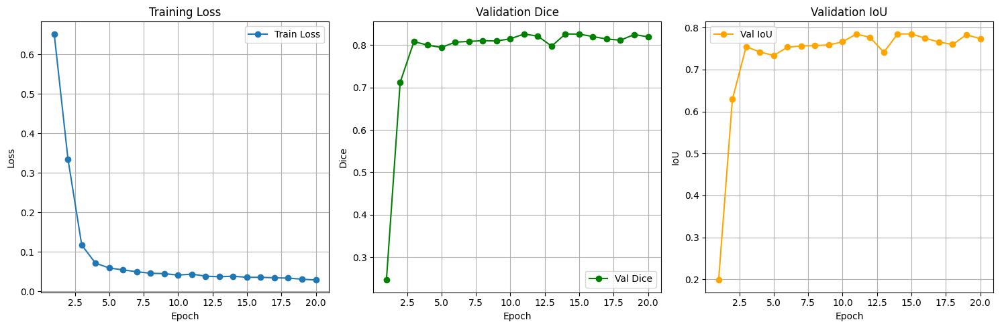


Final Per-Class Dice Evaluation


Validation: 100%|██████████| 24/24 [00:04<00:00,  5.16it/s]


Validation Loss: 0.3473
Average IoU: 0.7738
Average Dice: 0.8194

Per-Class Dice Scores:
  Background          : Dice = 0.0000
  LV                  : Dice = 0.8442
  RV                  : Dice = 0.9804
  LA                  : Dice = 0.9120
  RA                  : Dice = 0.9863
  Myocardium          : Dice = 0.9359
  Aorta               : Dice = 0.9852
  Pulmonary Artery    : Dice = 0.9113


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

train_dir = '/content/npz_dataset/pack/processed_data/ct_256/train/npz'
val_dir = '/content/npz_dataset/pack/processed_data/ct_256/val/npz'


num_classes = 8
batch_size = 16
lr = 1e-4
num_epochs = 20

train_dataset = AugmentedStackedDataset(train_dir)
val_dataset = StackedSliceDataset(val_dir)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = RAUNet(num_classes=num_classes, num_channels=3).cuda()

criterion = CELDiceFocal(dice_weight=0.7, num_classes=num_classes)
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=5e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)

train_losses, val_dices, val_ious = [], [], []

# Training
for epoch in range(num_epochs):
    model.train()
    epoch_loss = []

    for images, masks in train_loader:
        images, masks = images.cuda(), masks.cuda()

        optimizer.zero_grad()
        logits, _, _ = model(images)
        loss = criterion(logits, masks)
        loss.backward()
        optimizer.step()

        epoch_loss.append(loss.item())

    avg_loss = sum(epoch_loss) / len(epoch_loss)
    train_losses.append(avg_loss)
    print(f"[Epoch {epoch+1}/{num_epochs}] Loss: {avg_loss:.4f}")

    dice, iou, _ = val_multi(model, criterion, val_loader, num_classes, batch_size, [0], ignore_index=0)
    val_dices.append(dice)
    val_ious.append(iou)
    scheduler.step(dice)

    if (epoch + 1) % 10 == 0:
        torch.save(model.state_dict(), f"ct_teacher_epoch{epoch+1}.pth")

# Plotting
epochs = list(range(1, num_epochs + 1))
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(epochs, train_losses, marker='o', label='Train Loss')
plt.title("Training Loss")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.grid(True); plt.legend()

plt.subplot(1, 3, 2)
plt.plot(epochs, val_dices, marker='o', color='green', label='Val Dice')
plt.title("Validation Dice")
plt.xlabel("Epoch"); plt.ylabel("Dice"); plt.grid(True); plt.legend()

plt.subplot(1, 3, 3)
plt.plot(epochs, val_ious, marker='o', color='orange', label='Val IoU')
plt.title("Validation IoU")
plt.xlabel("Epoch"); plt.ylabel("IoU"); plt.grid(True); plt.legend()

plt.tight_layout()
plt.show()

# Final Evaluation with Per-Class Dice
print("\nFinal Per-Class Dice Evaluation")
_, _, per_class_dices = val_multi(model, criterion, val_loader, num_classes, batch_size, [0], ignore_index=0)

label_names = [
    "Background", "LV", "RV", "LA", "RA", "Myocardium", "Aorta", "Pulmonary Artery"
]

print("\nPer-Class Dice Scores:")
for i, score in enumerate(per_class_dices):
    print(f"  {label_names[i]:<20}: Dice = {score:.4f}")

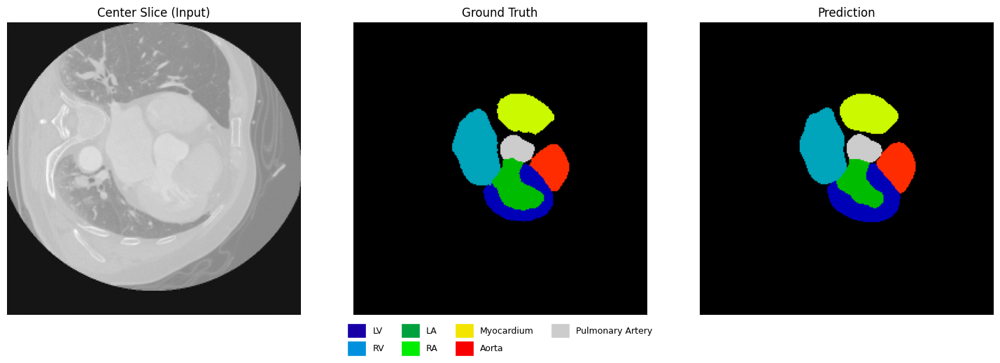

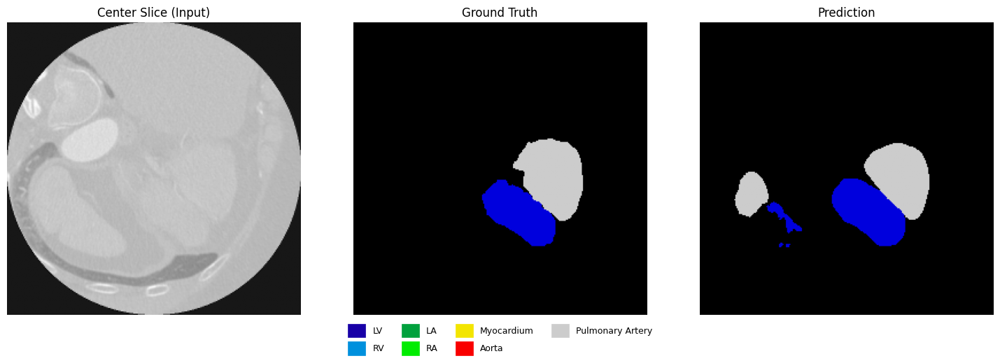

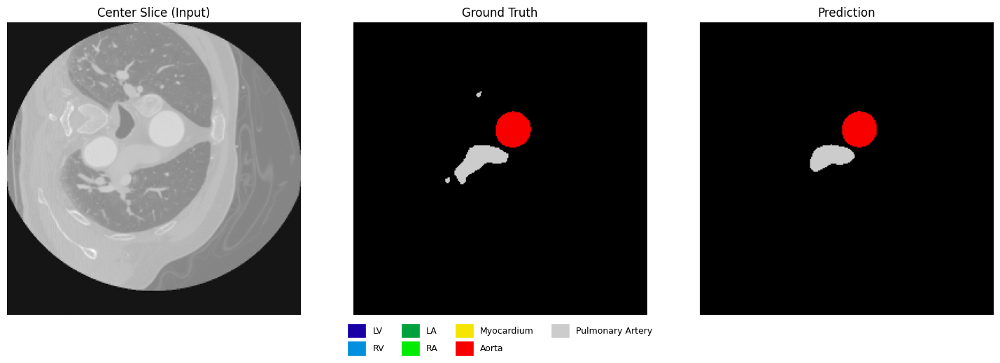

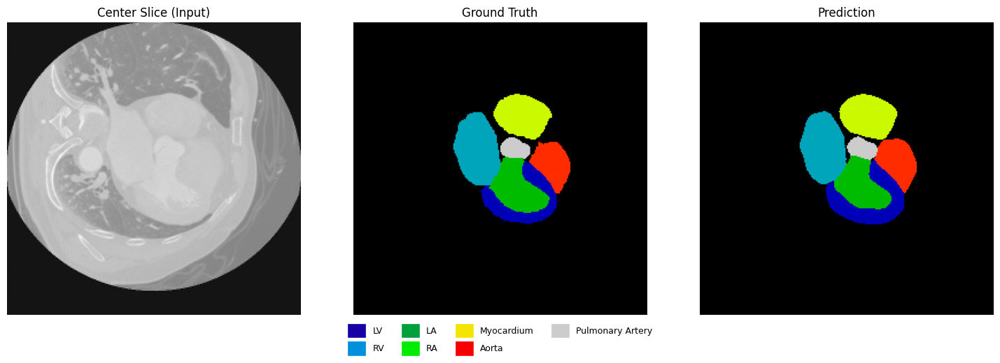

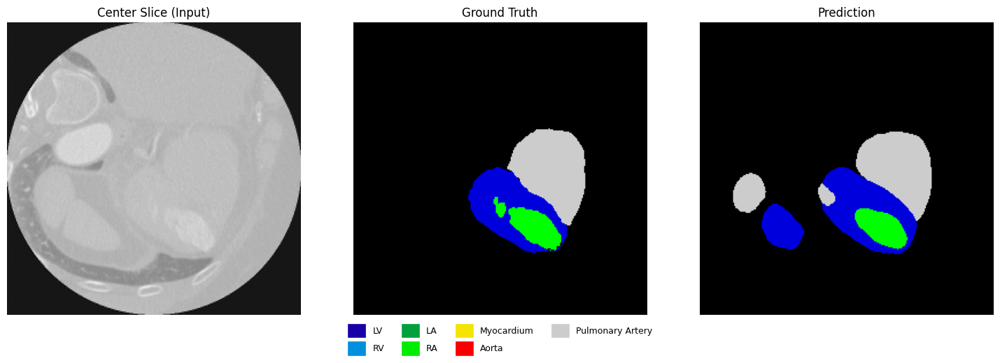

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch.nn.functional as F
import random

model.eval()

label_map = {
    1: "LV",
    2: "RV",
    3: "LA",
    4: "RA",
    5: "Myocardium",
    6: "Aorta",
    7: "Pulmonary Artery"
}

val_samples = list(val_dataset)
num_to_show = 5

random_indices = random.sample(range(len(val_samples)), num_to_show)

for idx in random_indices:
    image, mask = val_dataset[idx]
    input_tensor = image.unsqueeze(0).cuda()

    with torch.no_grad():
        logits, _, _ = model(input_tensor)
        pred = torch.argmax(F.softmax(logits, dim=1), dim=1).squeeze().cpu().numpy()

    input_center = image[1].cpu().numpy()
    gt = mask.numpy()

    # Plot
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(input_center, cmap='gray')
    axs[0].set_title("Center Slice (Input)")
    axs[0].axis('off')

    axs[1].imshow(gt, cmap='nipy_spectral')
    axs[1].set_title("Ground Truth")
    axs[1].axis('off')

    axs[2].imshow(pred, cmap='nipy_spectral')
    axs[2].set_title("Prediction")
    axs[2].axis('off')

    cmap = plt.get_cmap("nipy_spectral")
    handles = [
        mpatches.Patch(
            color=cmap(cls / len(label_map)),
            label=name,
            linewidth=0.5
        )
        for cls, name in label_map.items()
    ]
    fig.legend(handles=handles, loc='lower center', ncol=4, frameon=False, fontsize=9, handleheight=2, handlelength=2)

    plt.tight_layout(rect=[0, 0.1, 1, 1])
    plt.show()

Test Inference: 100%|██████████| 31/31 [00:10<00:00,  2.99it/s]



Per-Class Dice Scores (Test Set):
  LV                  : Dice = 0.8700
  RV                  : Dice = 0.9013
  LA                  : Dice = 0.7984
  RA                  : Dice = 0.8334
  Myocardium          : Dice = 0.8795
  Aorta               : Dice = 0.9325
  Pulmonary Artery    : Dice = 0.6000

Average Dice Score on Test Set: 0.8339


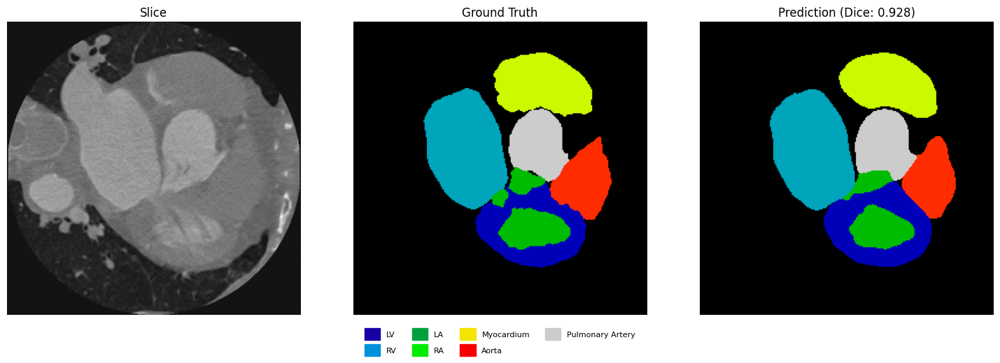

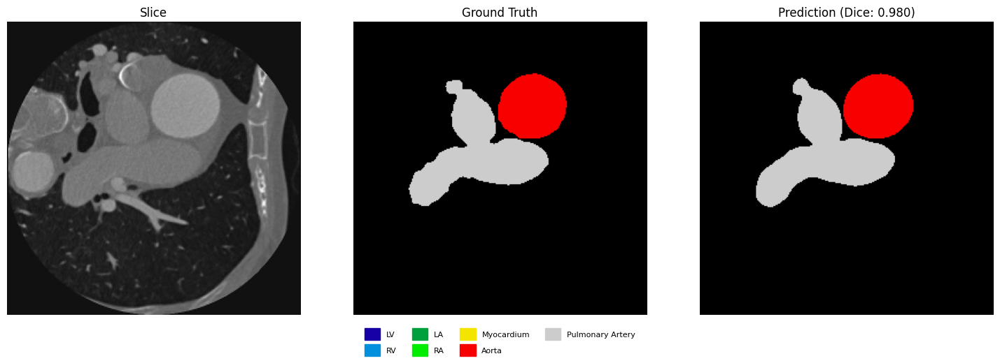

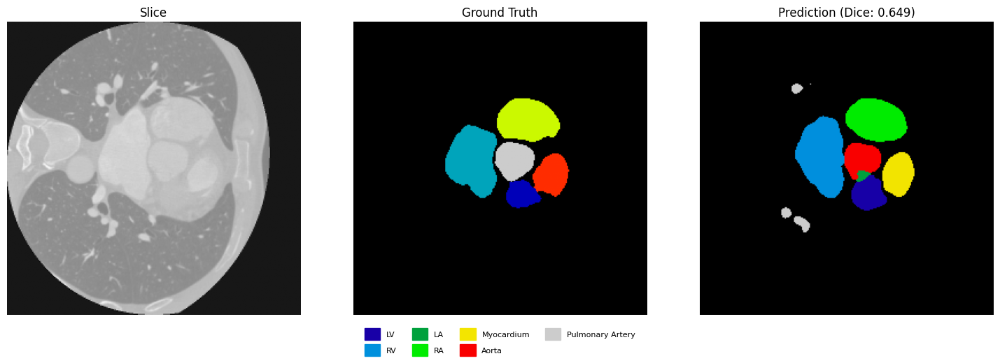

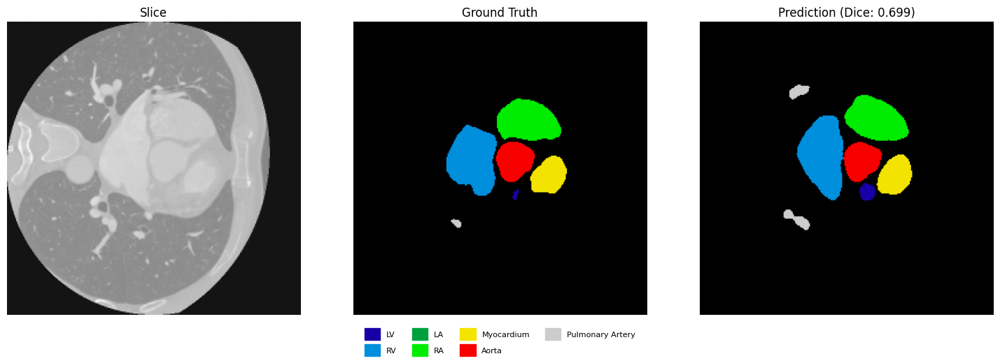

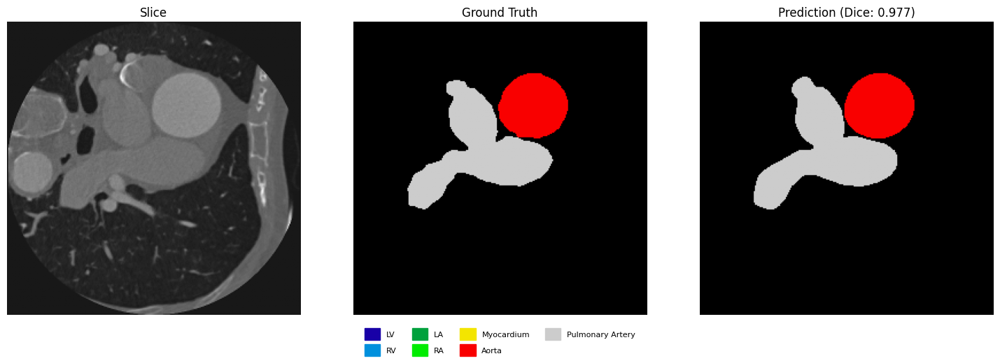

...

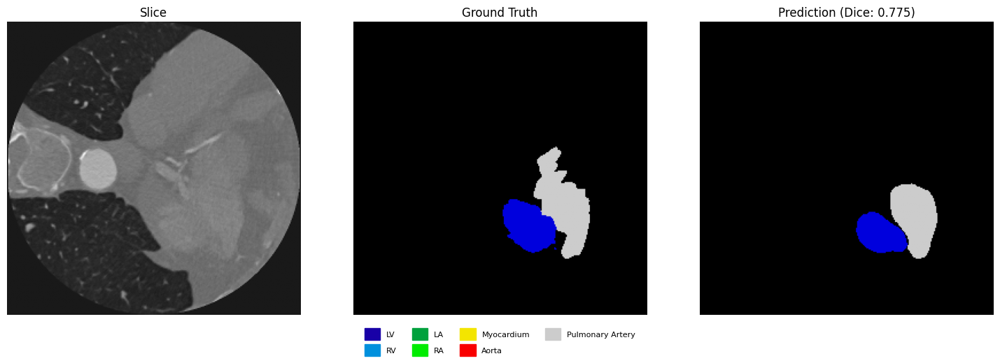

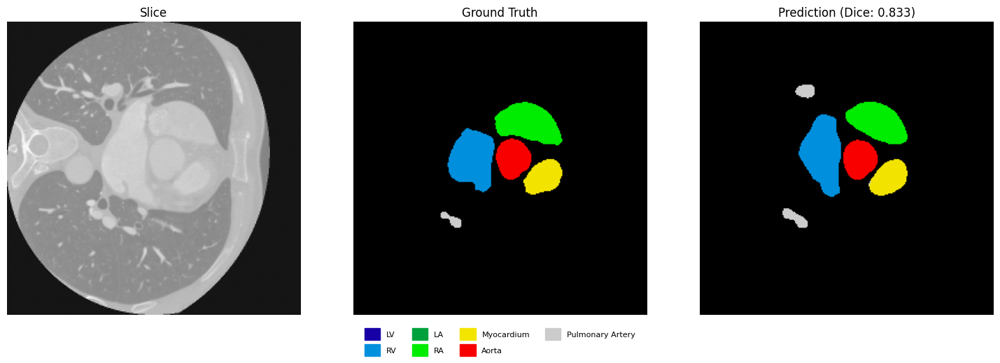

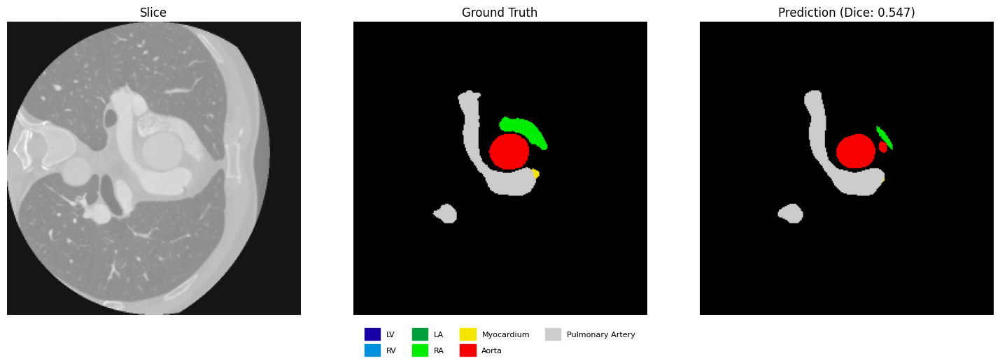

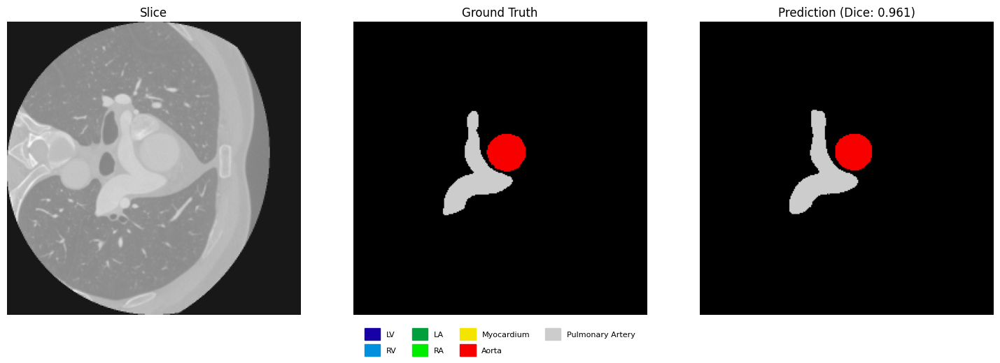

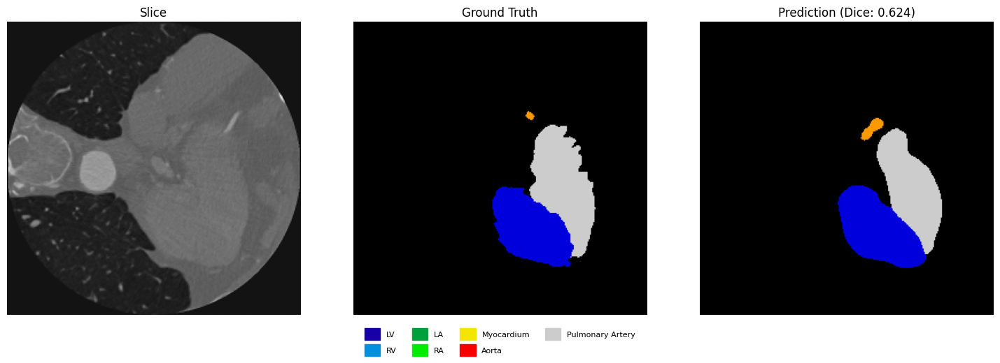

In [ ]:
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import matplotlib.patches as mpatches

test_dir = '/content/npz_dataset/pack/processed_data/ct_256/test/npz'
weights_path = 'ct_teacher_epoch20.pth'
num_classes = 8
batch_size = 16
num_to_visualize = 20

label_names = [
    "Background", "LV", "RV", "LA", "RA", "Myocardium", "Aorta", "Pulmonary Artery"
]

model = RAUNet(num_classes=num_classes, num_channels=3)
model.load_state_dict(torch.load(weights_path, map_location='cuda:0'))
model = model.cuda()
model.eval()

test_dataset = StackedSliceDataset(test_dir)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

def compute_dice_per_class(pred, target, num_classes):
    dices = []
    for cls in range(num_classes):
        pred_bin = (pred == cls).astype(np.uint8)
        target_bin = (target == cls).astype(np.uint8)
        intersection = np.sum(pred_bin * target_bin)
        union = np.sum(pred_bin) + np.sum(target_bin)
        dice = 2 * intersection / union if union > 0 else np.nan
        dices.append(dice)
    return dices

dice_scores_all = []
class_wise_dices = [[] for _ in range(num_classes)]
all_preds, all_gts = [], []

for images, masks in tqdm(test_loader, desc="Test Inference"):
    images = images.cuda()
    masks = masks.cuda()

    with torch.no_grad():
        logits, _, _ = model(images)
        preds = torch.argmax(F.softmax(logits, dim=1), dim=1)

    for pred, gt in zip(preds.cpu().numpy(), masks.cpu().numpy()):
        dices = compute_dice_per_class(pred, gt, num_classes)
        for cls in range(num_classes):
            if not np.isnan(dices[cls]):
                class_wise_dices[cls].append(dices[cls])
        dice_scores_all.append(np.nanmean(dices[1:]))
        all_preds.append(pred)
        all_gts.append(gt)

print("\nPer-Class Dice Scores (Test Set):")
for i in range(1, num_classes):
    if len(class_wise_dices[i]):
        avg = np.mean(class_wise_dices[i])
        print(f"  {label_names[i]:<20}: Dice = {avg:.4f}")
    else:
        print(f"  {label_names[i]:<20}: Dice = N/A")

print(f"\nAverage Dice Score on Test Set: {np.nanmean(dice_scores_all):.4f}")

label_map = {
    1: "LV", 2: "RV", 3: "LA", 4: "RA", 5: "Myocardium", 6: "Aorta", 7: "Pulmonary Artery"
}

sample_indices = random.sample(range(len(all_preds)), num_to_visualize)

for idx in sample_indices:
    input_tensor, _ = test_dataset[idx]
    input_center = input_tensor[1].numpy()  # Middle slice

    pred = all_preds[idx]
    gt = all_gts[idx]
    dice = np.nanmean(compute_dice_per_class(pred, gt, num_classes)[1:])

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(input_center, cmap='gray')
    axs[0].set_title("Slice")
    axs[0].axis('off')

    axs[1].imshow(gt, cmap='nipy_spectral')
    axs[1].set_title("Ground Truth")
    axs[1].axis('off')

    axs[2].imshow(pred, cmap='nipy_spectral')
    axs[2].set_title(f"Prediction (Dice: {dice:.3f})")
    axs[2].axis('off')

    cmap = plt.get_cmap("nipy_spectral")
    handles = [
        mpatches.Patch(color=cmap(cls / len(label_map)), label=name)
        for cls, name in label_map.items()
    ]
    fig.legend(handles=handles, loc='lower center', ncol=4, frameon=False, fontsize=8, handleheight=2, handlelength=2)

    plt.tight_layout(rect=[0, 0.1, 1, 1])
    plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# KD Losses
def prediction_map_distillation(student_logits, teacher_logits, T=4):
    p = F.log_softmax(student_logits / T, dim=1)
    q = F.softmax(teacher_logits / T, dim=1)
    return F.kl_div(p, q, reduction='batchmean') * (T ** 2)

def at(x, exp=4):
    return F.normalize(x.pow(exp).mean(1).view(x.size(0), -1))

def importance_maps_distillation(s, t, exp=4):
    if s.shape[2:] != t.shape[2:]:
        s = F.interpolate(s, size=t.shape[2:], mode='bilinear', align_corners=False)
    return torch.sum((at(s, exp) - at(t, exp)).pow(2), dim=1).mean()

def region_contrast(x, gt):
    smooth = 1.0
    mask0 = gt[:, 0].unsqueeze(1)
    mask1 = gt[:, 1].unsqueeze(1)
    region0 = torch.sum(x * mask0, dim=(2, 3)) / (torch.sum(mask0, dim=(2, 3)) + smooth)
    region1 = torch.sum(x * mask1, dim=(2, 3)) / (torch.sum(mask1, dim=(2, 3)) + smooth)
    return F.cosine_similarity(region0, region1, dim=1)

def region_affinity_distillation(s, t, gt):
    gt = F.interpolate(gt, s.size()[2:], mode='nearest')
    return (region_contrast(s, gt) - region_contrast(t, gt)).pow(2).mean()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class InitialBlock(nn.Module):
    def __init__(self, in_channels, out_channels, norm_layer=nn.BatchNorm2d):
        super(InitialBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, 3, 2, 1, bias=False)
        self.maxpool = nn.MaxPool2d(2, 2)
        self.bn = norm_layer(out_channels + in_channels)
        self.act = nn.PReLU()

    def forward(self, x):
        x_conv = self.conv(x)
        x_pool = self.maxpool(x)
        x = torch.cat([x_conv, x_pool], dim=1)
        x = self.bn(x)
        x = self.act(x)
        return x

class Bottleneck(nn.Module):
    def __init__(self, in_channels, inter_channels, out_channels, dilation=1, asymmetric=False,
                 downsampling=False, norm_layer=nn.BatchNorm2d):
        super(Bottleneck, self).__init__()
        self.downsampling = downsampling
        if downsampling:
            self.maxpool = nn.MaxPool2d(2, 2, return_indices=True)
            self.conv_down = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, 1, bias=False),
                norm_layer(out_channels)
            )

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, inter_channels, 1, bias=False),
            norm_layer(inter_channels),
            nn.PReLU()
        )

        if downsampling:
            self.conv2 = nn.Sequential(
                nn.Conv2d(inter_channels, inter_channels, 2, stride=2, bias=False),
                norm_layer(inter_channels),
                nn.PReLU()
            )
        else:
            if asymmetric:
                self.conv2 = nn.Sequential(
                    nn.Conv2d(inter_channels, inter_channels, (5, 1), padding=(2, 0), bias=False),
                    nn.Conv2d(inter_channels, inter_channels, (1, 5), padding=(0, 2), bias=False),
                    norm_layer(inter_channels),
                    nn.PReLU()
                )
            else:
                self.conv2 = nn.Sequential(
                    nn.Conv2d(inter_channels, inter_channels, 3, dilation=dilation, padding=dilation, bias=False),
                    norm_layer(inter_channels),
                    nn.PReLU()
                )

        self.conv3 = nn.Sequential(
            nn.Conv2d(inter_channels, out_channels, 1, bias=False),
            norm_layer(out_channels),
            nn.Dropout2d(0.1)
        )
        self.act = nn.PReLU()

    def forward(self, x):
        identity = x
        if self.downsampling:
            identity, max_indices = self.maxpool(identity)
            identity = self.conv_down(identity)

        out = self.conv1(x)
        out = self.conv2(out)
        out = self.conv3(out)
        out = self.act(out + identity)

        if self.downsampling:
            return out, max_indices
        else:
            return out

class UpsamplingBottleneck(nn.Module):
    def __init__(self, in_channels, inter_channels, out_channels, norm_layer=nn.BatchNorm2d):
        super(UpsamplingBottleneck, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 1, bias=False),
            norm_layer(out_channels)
        )
        self.upsample = nn.MaxUnpool2d(2)

        self.block = nn.Sequential(
            nn.Conv2d(in_channels, inter_channels, 1, bias=False),
            norm_layer(inter_channels),
            nn.PReLU(),
            nn.ConvTranspose2d(inter_channels, inter_channels, 2, 2, bias=False),
            norm_layer(inter_channels),
            nn.PReLU(),
            nn.Conv2d(inter_channels, out_channels, 1, bias=False),
            norm_layer(out_channels),
            nn.Dropout2d(0.1)
        )
        self.act = nn.PReLU()

    def forward(self, x, max_indices):
        out_up = self.conv(x)
        out_up = self.upsample(out_up, max_indices)
        out_ext = self.block(x)
        return self.act(out_up + out_ext)

class ENet(nn.Module):
    def __init__(self, nclass, in_channels=9):
        super(ENet, self).__init__()
        self.initial = InitialBlock(in_channels, 13)

        self.bottleneck1_0 = Bottleneck(16, 16, 64, downsampling=True)
        self.bottleneck1_1 = Bottleneck(64, 16, 64)
        self.bottleneck1_2 = Bottleneck(64, 16, 64)
        self.bottleneck1_3 = Bottleneck(64, 16, 64)
        self.bottleneck1_4 = Bottleneck(64, 16, 64)

        self.bottleneck2_0 = Bottleneck(64, 32, 128, downsampling=True)
        self.bottleneck2_1 = Bottleneck(128, 32, 128)
        self.bottleneck2_2 = Bottleneck(128, 32, 128, dilation=2)
        self.bottleneck2_3 = Bottleneck(128, 32, 128, asymmetric=True)
        self.bottleneck2_4 = Bottleneck(128, 32, 128, dilation=4)
        self.bottleneck2_5 = Bottleneck(128, 32, 128)
        self.bottleneck2_6 = Bottleneck(128, 32, 128, dilation=8)
        self.bottleneck2_7 = Bottleneck(128, 32, 128, asymmetric=True)
        self.bottleneck2_8 = Bottleneck(128, 32, 128, dilation=16)

        self.bottleneck3_1 = Bottleneck(128, 32, 128)
        self.bottleneck3_2 = Bottleneck(128, 32, 128, dilation=2)
        self.bottleneck3_3 = Bottleneck(128, 32, 128, asymmetric=True)
        self.bottleneck3_4 = Bottleneck(128, 32, 128, dilation=4)
        self.bottleneck3_5 = Bottleneck(128, 32, 128)
        self.bottleneck3_6 = Bottleneck(128, 32, 128, dilation=8)
        self.bottleneck3_7 = Bottleneck(128, 32, 128, asymmetric=True)
        self.bottleneck3_8 = Bottleneck(128, 32, 128, dilation=16)

        self.bottleneck4_0 = UpsamplingBottleneck(128, 16, 64)
        self.bottleneck4_1 = Bottleneck(64, 16, 64)
        self.bottleneck4_2 = Bottleneck(64, 16, 64)

        self.bottleneck5_0 = UpsamplingBottleneck(64, 4, 16)
        self.bottleneck5_1 = Bottleneck(16, 4, 16)

        self.fullconv = nn.ConvTranspose2d(16, nclass, 2, 2, bias=False)

    def forward(self, x):
        low_feature = self.initial(x)

        x, max_indices1 = self.bottleneck1_0(low_feature)
        x = self.bottleneck1_1(x)
        x = self.bottleneck1_2(x)
        x = self.bottleneck1_3(x)
        x = self.bottleneck1_4(x)

        x, max_indices2 = self.bottleneck2_0(x)
        x = self.bottleneck2_1(x)
        x = self.bottleneck2_2(x)
        x = self.bottleneck2_3(x)
        x = self.bottleneck2_4(x)
        x = self.bottleneck2_5(x)
        x = self.bottleneck2_6(x)
        x = self.bottleneck2_7(x)
        x = self.bottleneck2_8(x)

        x = self.bottleneck3_1(x)
        x = self.bottleneck3_2(x)
        x = self.bottleneck3_3(x)
        x = self.bottleneck3_4(x)
        x = self.bottleneck3_5(x)
        x = self.bottleneck3_6(x)
        x = self.bottleneck3_7(x)
        x = self.bottleneck3_8(x)
        high_feature = x

        x = self.bottleneck4_0(x, max_indices2)
        x = self.bottleneck4_1(x)
        x = self.bottleneck4_2(x)

        x = self.bottleneck5_0(x, max_indices1)
        x = self.bottleneck5_1(x)

        x = self.fullconv(x)
        return F.log_softmax(x, dim=1), low_feature, high_feature

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
import numpy as np

def compute_dice(pred, target, num_classes):
    dices = []
    for cls in range(1, num_classes):
        pred_bin = (pred == cls).astype(np.uint8)
        target_bin = (target == cls).astype(np.uint8)
        intersection = np.sum(pred_bin * target_bin)
        union = np.sum(pred_bin) + np.sum(target_bin)
        dice = 2 * intersection / union if union else 1.0
        dices.append(dice)
    return np.mean(dices)

class FocalNLLLoss(nn.Module):
    def __init__(self, gamma=2.0, weight=None):
        super().__init__()
        self.gamma = gamma
        self.weight = weight

    def forward(self, inputs, targets):
        probs = torch.exp(inputs)
        targets = targets.unsqueeze(1)
        probs = torch.gather(probs, 1, targets).squeeze(1)
        focal_factor = (1 - probs) ** self.gamma
        loss = F.nll_loss(inputs, targets.squeeze(1), weight=self.weight, reduction='none')
        return (focal_factor * loss).mean()

class CELDiceFocal(nn.Module):
    def __init__(self, dice_weight=0.7, num_classes=8, gamma=2.0):
        super().__init__()
        weights = torch.tensor([0.5] + [1.0] * (num_classes - 1)).cuda()
        self.ce = FocalNLLLoss(gamma=gamma, weight=weights)
        self.dice_weight = dice_weight
        self.num_classes = num_classes

    def forward(self, outputs, targets):
        ce_loss = self.ce(outputs, targets)
        dice_loss = self.multi_class_dice_loss(outputs, targets)
        return (1 - self.dice_weight) * ce_loss + self.dice_weight * dice_loss

    def multi_class_dice_loss(self, outputs, targets, eps=1e-6):
        probs = torch.exp(outputs)
        targets_one_hot = F.one_hot(targets, self.num_classes).permute(0, 3, 1, 2).float()
        dims = (0, 2, 3)
        intersection = torch.sum(probs * targets_one_hot, dims)
        cardinality = torch.sum(probs + targets_one_hot, dims)
        dice = (2. * intersection + eps) / (cardinality + eps)
        return 1 - dice.mean()

def prediction_map_distillation(student_logits, teacher_logits, T=4):
    p = F.log_softmax(student_logits / T, dim=1)
    q = F.softmax(teacher_logits / T, dim=1)
    return F.kl_div(p, q, reduction='batchmean') * (T ** 2)

def at(x, exp=4):
    return F.normalize(x.pow(exp).mean(1).view(x.size(0), -1))

def importance_maps_distillation(s, t, exp=4):
    if s.shape[2:] != t.shape[2:]:
        s = F.interpolate(s, size=t.shape[2:], mode='bilinear', align_corners=False)
    return torch.sum((at(s, exp) - at(t, exp)).pow(2), dim=1).mean()

def region_contrast(x, gt):
    smooth = 1.0
    mask0 = gt[:, 0].unsqueeze(1)
    mask1 = gt[:, 1].unsqueeze(1)
    region0 = torch.sum(x * mask0, dim=(2, 3)) / (torch.sum(mask0, dim=(2, 3)) + smooth)
    region1 = torch.sum(x * mask1, dim=(2, 3)) / (torch.sum(mask1, dim=(2, 3)) + smooth)
    return F.cosine_similarity(region0, region1, dim=1)

def region_affinity_distillation(s, t, gt):
    gt = F.interpolate(gt, s.size()[2:], mode='nearest')
    return (region_contrast(s, gt) - region_contrast(t, gt)).pow(2).mean()

teacher = RAUNet(num_classes=8, num_channels=3)
teacher.load_state_dict(torch.load("ct_teacher_epoch20.pth"))
teacher = teacher.cuda()
teacher.eval()

student = ENet(nclass=8, in_channels=3).cuda()

criterion = CELDiceFocal(dice_weight=0.7, num_classes=8)
optimizer = torch.optim.AdamW(student.parameters(), lr=1e-4, weight_decay=5e-5)

alpha, beta1, beta2, T = 0.001, 0.1, 0.1, 8
num_epochs = 60

for epoch in range(num_epochs):
    student.train()
    epoch_loss = []
    dice_scores = []

    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        images, masks = images.cuda(), masks.cuda()

        with torch.no_grad():
            t_logits, t_low, t_high = teacher(images)

        s_logits, s_low, s_high = student(images)

        # Resize student feature maps to teacher's shape before RAD
        s_low = F.interpolate(s_low, size=t_low.shape[2:], mode='bilinear', align_corners=False)
        s_high = F.interpolate(s_high, size=t_high.shape[2:], mode='bilinear', align_corners=False)


        masks_onehot = F.one_hot(masks, num_classes=8).permute(0, 3, 1, 2).float()

        loss_seg = criterion(s_logits, masks)
        loss_pmd = prediction_map_distillation(s_logits, t_logits, T)
        loss_imd = importance_maps_distillation(s_low, t_low) + importance_maps_distillation(s_high, t_high)
        loss_rad = region_affinity_distillation(s_low, t_low, masks_onehot) + region_affinity_distillation(s_high, t_high, masks_onehot)

        loss = loss_seg + alpha * loss_pmd + beta1 * loss_imd + beta2 * loss_rad

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss.append(loss.item())

        pred = torch.argmax(F.softmax(s_logits, dim=1), dim=1)
        dice = compute_dice(pred.cpu().numpy(), masks.cpu().numpy(), num_classes=8)
        dice_scores.append(dice)

    print(f"[Epoch {epoch+1}] KD Loss: {np.mean(epoch_loss):.4f} | Student Dice: {np.mean(dice_scores):.4f}")

student.eval()
val_preds = []
val_targets = []

with torch.no_grad():
    for images, masks in val_loader:
        images = images.cuda()
        masks = masks.cuda()

        logits, _, _ = student(images)
        preds = torch.argmax(F.softmax(logits, dim=1), dim=1)

        val_preds.extend(preds.cpu().numpy())
        val_targets.extend(masks.cpu().numpy())

per_class_dices = [[] for _ in range(8)]

for pred, gt in zip(val_preds, val_targets):
    for cls in range(1, 8):
        pred_bin = (pred == cls).astype(np.uint8)
        gt_bin = (gt == cls).astype(np.uint8)
        inter = np.sum(pred_bin * gt_bin)
        union = np.sum(pred_bin) + np.sum(gt_bin)
        dice = 2 * inter / union if union > 0 else np.nan
        if not np.isnan(dice):
            per_class_dices[cls].append(dice)

label_names = [
    "Background", "LV", "RV", "LA", "RA", "Myocardium", "Aorta", "Pulmonary Artery"
]

print("\nFinal Per-Class Dice on Validation Set:")
for cls in range(1, 8):
    mean_dice = np.mean(per_class_dices[cls]) if per_class_dices[cls] else 0
    print(f"  {label_names[cls]:<20}: Dice = {mean_dice:.4f}")

Epoch 1/60: 100%|██████████| 212/212 [00:40<00:00,  5.19it/s]


[Epoch 1] KD Loss: 1613.6853 | Student Dice: 0.0355


Epoch 2/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 2] KD Loss: 1496.8775 | Student Dice: 0.0516


Epoch 3/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 3] KD Loss: 1352.2022 | Student Dice: 0.0644


Epoch 4/60: 100%|██████████| 212/212 [00:40<00:00,  5.19it/s]


[Epoch 4] KD Loss: 1181.5285 | Student Dice: 0.0716


Epoch 5/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 5] KD Loss: 998.1526 | Student Dice: 0.0585


Epoch 6/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 6] KD Loss: 817.9280 | Student Dice: 0.0225


Epoch 7/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 7] KD Loss: 651.3783 | Student Dice: 0.0034


Epoch 8/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 8] KD Loss: 514.2478 | Student Dice: 0.0002


Epoch 9/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 9] KD Loss: 408.1154 | Student Dice: 0.0000


Epoch 10/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 10] KD Loss: 332.5047 | Student Dice: 0.0007


Epoch 11/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 11] KD Loss: 283.5019 | Student Dice: 0.0000


Epoch 12/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 12] KD Loss: 251.8241 | Student Dice: 0.0000


Epoch 13/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 13] KD Loss: 230.7501 | Student Dice: 0.0000


Epoch 14/60: 100%|██████████| 212/212 [00:40<00:00,  5.18it/s]


[Epoch 14] KD Loss: 219.9262 | Student Dice: 0.0000


Epoch 15/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 15] KD Loss: 213.7816 | Student Dice: 0.0000


Epoch 16/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 16] KD Loss: 209.1784 | Student Dice: 0.0000


Epoch 17/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 17] KD Loss: 206.1123 | Student Dice: 0.0007


Epoch 18/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 18] KD Loss: 204.4406 | Student Dice: 0.0000


Epoch 19/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 19] KD Loss: 202.5105 | Student Dice: 0.0000


Epoch 20/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 20] KD Loss: 201.2061 | Student Dice: 0.0000


Epoch 21/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 21] KD Loss: 200.2356 | Student Dice: 0.0000


Epoch 22/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 22] KD Loss: 199.4593 | Student Dice: 0.0000


Epoch 23/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 23] KD Loss: 198.4751 | Student Dice: 0.0000


Epoch 24/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 24] KD Loss: 197.8632 | Student Dice: 0.0000


Epoch 25/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 25] KD Loss: 197.3671 | Student Dice: 0.0000


Epoch 26/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 26] KD Loss: 196.7450 | Student Dice: 0.0000


Epoch 27/60: 100%|██████████| 212/212 [00:40<00:00,  5.17it/s]


[Epoch 27] KD Loss: 195.9012 | Student Dice: 0.0000


Epoch 28/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 28] KD Loss: 195.1803 | Student Dice: 0.0000


Epoch 29/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 29] KD Loss: 194.6770 | Student Dice: 0.0000


Epoch 30/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 30] KD Loss: 194.4904 | Student Dice: 0.0000


Epoch 31/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 31] KD Loss: 194.1409 | Student Dice: 0.0000


Epoch 32/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 32] KD Loss: 193.5126 | Student Dice: 0.0000


Epoch 33/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 33] KD Loss: 192.2354 | Student Dice: 0.0000


Epoch 34/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 34] KD Loss: 191.0345 | Student Dice: 0.0000


Epoch 35/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 35] KD Loss: 188.9274 | Student Dice: 0.0000


Epoch 36/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 36] KD Loss: 187.5469 | Student Dice: 0.0000


Epoch 37/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 37] KD Loss: 184.7192 | Student Dice: 0.0000


Epoch 38/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 38] KD Loss: 181.6830 | Student Dice: 0.0011


Epoch 39/60: 100%|██████████| 212/212 [00:40<00:00,  5.22it/s]


[Epoch 39] KD Loss: 178.2284 | Student Dice: 0.0060


Epoch 40/60: 100%|██████████| 212/212 [00:40<00:00,  5.19it/s]


[Epoch 40] KD Loss: 175.3737 | Student Dice: 0.0134


Epoch 41/60: 100%|██████████| 212/212 [00:40<00:00,  5.19it/s]


[Epoch 41] KD Loss: 172.8671 | Student Dice: 0.0193


Epoch 42/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 42] KD Loss: 170.2918 | Student Dice: 0.0330


Epoch 43/60: 100%|██████████| 212/212 [00:40<00:00,  5.19it/s]


[Epoch 43] KD Loss: 168.1023 | Student Dice: 0.0561


Epoch 44/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 44] KD Loss: 166.1987 | Student Dice: 0.0791


Epoch 45/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 45] KD Loss: 164.4050 | Student Dice: 0.0959


Epoch 46/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 46] KD Loss: 162.5055 | Student Dice: 0.1347


Epoch 47/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 47] KD Loss: 160.8273 | Student Dice: 0.1417


Epoch 48/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 48] KD Loss: 159.8694 | Student Dice: 0.1506


Epoch 49/60: 100%|██████████| 212/212 [00:40<00:00,  5.19it/s]


[Epoch 49] KD Loss: 158.0182 | Student Dice: 0.1660


Epoch 50/60: 100%|██████████| 212/212 [00:40<00:00,  5.19it/s]


[Epoch 50] KD Loss: 156.4468 | Student Dice: 0.1843


Epoch 51/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 51] KD Loss: 155.1222 | Student Dice: 0.1755


Epoch 52/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 52] KD Loss: 153.3433 | Student Dice: 0.1629


Epoch 53/60: 100%|██████████| 212/212 [00:40<00:00,  5.20it/s]


[Epoch 53] KD Loss: 151.6415 | Student Dice: 0.1588


Epoch 54/60: 100%|██████████| 212/212 [00:40<00:00,  5.17it/s]


[Epoch 54] KD Loss: 149.9902 | Student Dice: 0.1634


Epoch 55/60: 100%|██████████| 212/212 [00:40<00:00,  5.18it/s]


[Epoch 55] KD Loss: 147.8707 | Student Dice: 0.1692


Epoch 56/60: 100%|██████████| 212/212 [00:40<00:00,  5.19it/s]


[Epoch 56] KD Loss: 145.8333 | Student Dice: 0.1778


Epoch 57/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 57] KD Loss: 144.1457 | Student Dice: 0.1828


Epoch 58/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]


[Epoch 58] KD Loss: 142.7613 | Student Dice: 0.1881


Epoch 59/60: 100%|██████████| 212/212 [00:40<00:00,  5.22it/s]


[Epoch 59] KD Loss: 141.4983 | Student Dice: 0.1886


Epoch 60/60: 100%|██████████| 212/212 [00:40<00:00,  5.21it/s]

[Epoch 60] KD Loss: 139.0547 | Student Dice: 0.1921



Final Per-Class Dice on Validation Set:
  LV                  : Dice = 0.1940
  RV                  : Dice = 0.0359
  LA                  : Dice = 0.0000
  RA                  : Dice = 0.0000
  Myocardium          : Dice = 0.5138
  Aorta               : Dice = 0.0000
  Pulmonary Artery    : Dice = 0.0000


Student Test Inference: 100%|██████████| 31/31 [00:08<00:00,  3.75it/s]



Per-Class Dice Scores (Student on Test Set):
  LV                  : Dice = 0.3126
  RV                  : Dice = 0.0745
  LA                  : Dice = 0.0005
  RA                  : Dice = 0.0000
  Myocardium          : Dice = 0.5704
  Aorta               : Dice = 0.0000
  Pulmonary Artery    : Dice = 0.0000

Student Avg Dice on Test Set: 0.1713


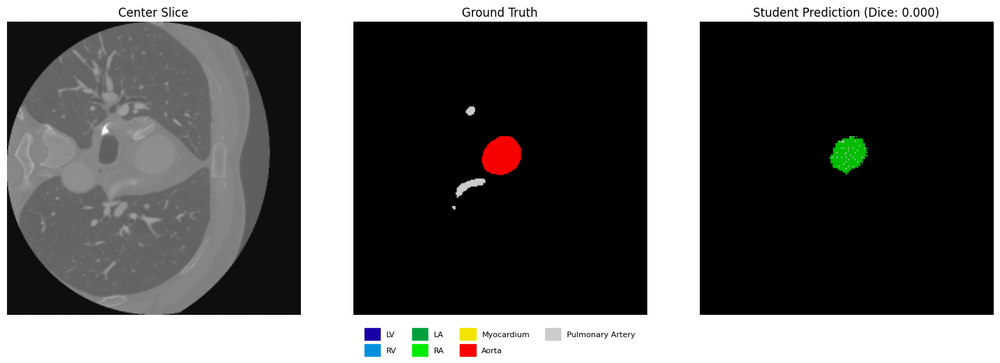

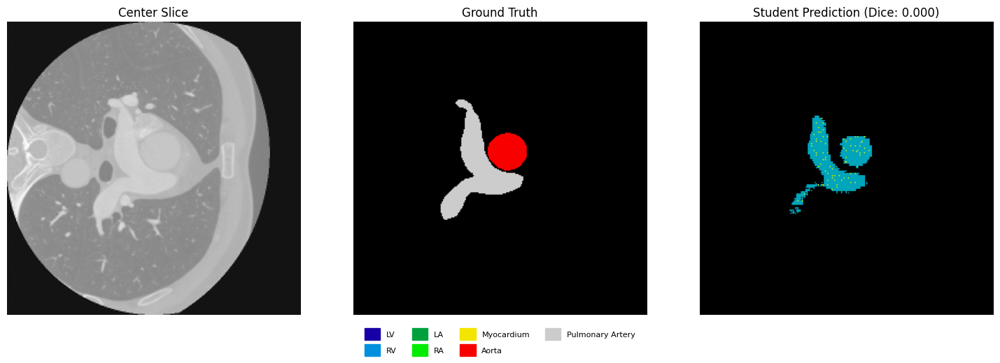

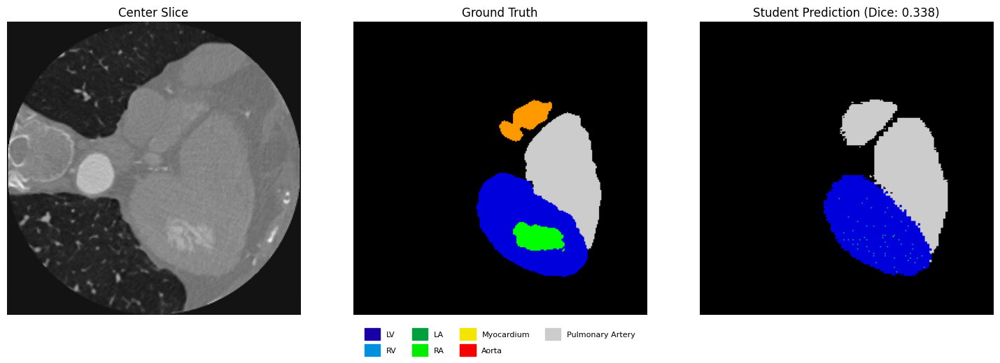

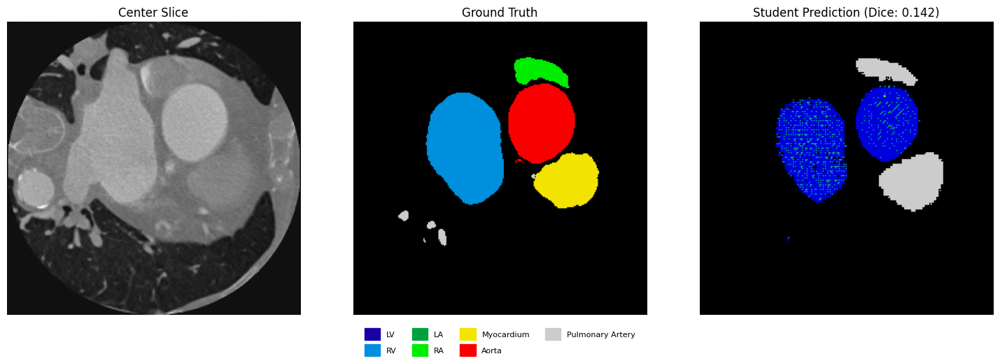

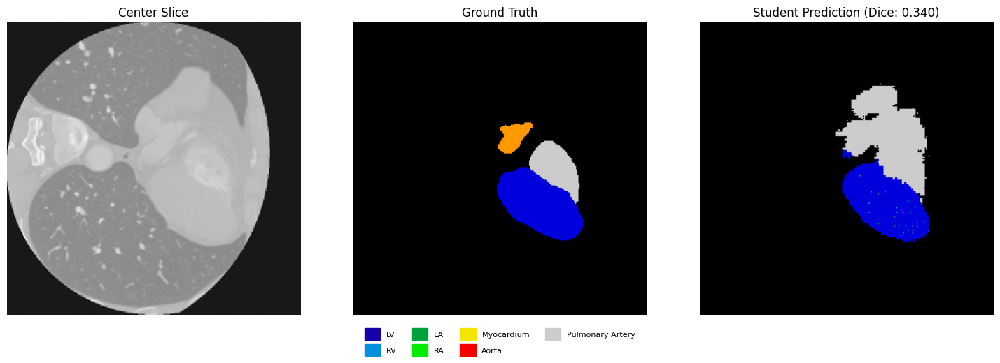

...

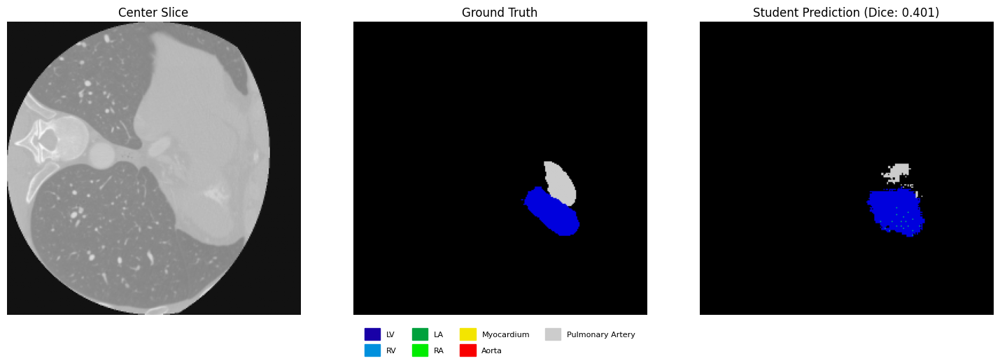

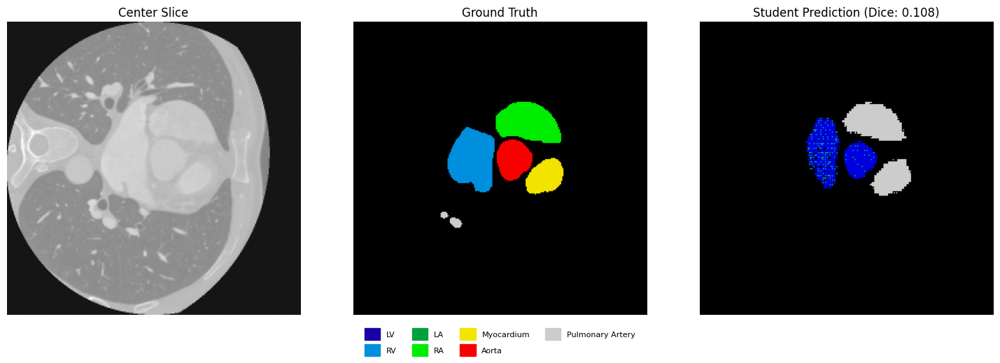

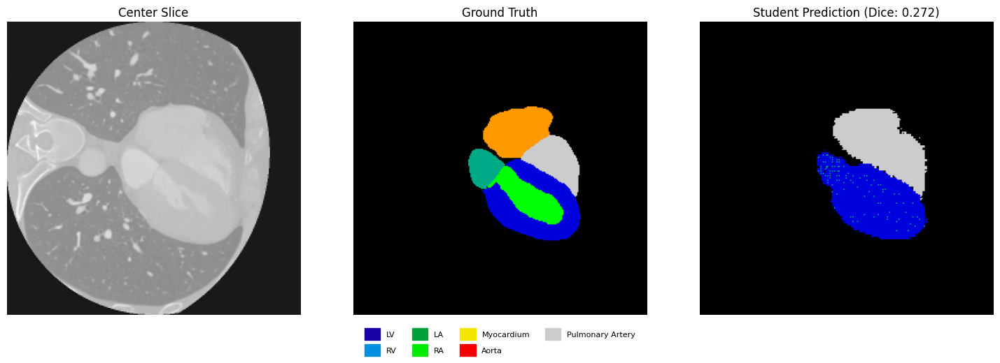

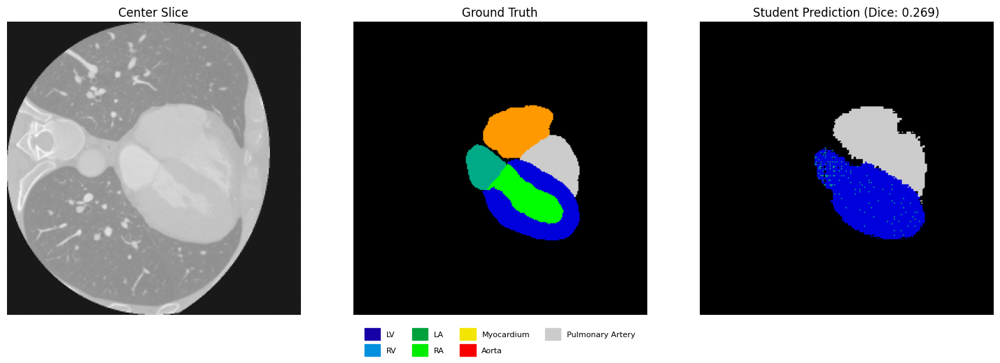

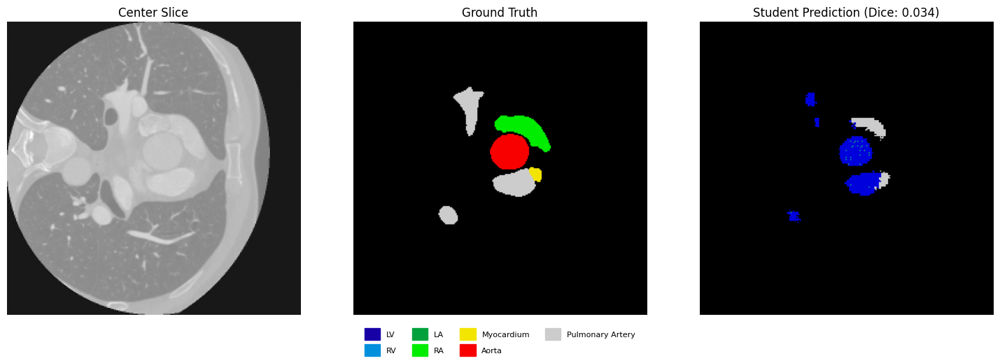

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
import matplotlib.patches as mpatches

def compute_dice_per_class(pred, target, num_classes):
    dices = []
    for cls in range(num_classes):
        pred_bin = (pred == cls).astype(np.uint8)
        target_bin = (target == cls).astype(np.uint8)
        intersection = np.sum(pred_bin * target_bin)
        union = np.sum(pred_bin) + np.sum(target_bin)
        dice = 2 * intersection / union if union else np.nan
        dices.append(dice)
    return dices

student.eval()
num_classes = 8
num_to_visualize = 20
label_names = ["Background", "LV", "RV", "LA", "RA", "Myocardium", "Aorta", "Pulmonary Artery"]
label_map = {i: name for i, name in enumerate(label_names) if i > 0}

all_preds, all_gts = [], []
dice_scores_all = []
class_wise_dices = [[] for _ in range(num_classes)]

for images, masks in tqdm(test_loader, desc="Student Test Inference"):
    images = images.cuda()
    masks = masks.cuda()

    with torch.no_grad():
        logits, _, _ = student(images)
        preds = torch.argmax(F.softmax(logits, dim=1), dim=1)

    for pred, gt in zip(preds.cpu().numpy(), masks.cpu().numpy()):
        per_class = compute_dice_per_class(pred, gt, num_classes)
        for cls in range(num_classes):
            if not np.isnan(per_class[cls]):
                class_wise_dices[cls].append(per_class[cls])
        dice_scores_all.append(np.nanmean(per_class[1:]))  # exclude background
        all_preds.append(pred)
        all_gts.append(gt)

print("\nPer-Class Dice Scores (Student on Test Set):")
for i in range(1, num_classes):  # Skip background
    if len(class_wise_dices[i]):
        avg = np.mean(class_wise_dices[i])
        print(f"  {label_names[i]:<20}: Dice = {avg:.4f}")
    else:
        print(f"  {label_names[i]:<20}: Dice = N/A")

print(f"\nStudent Avg Dice on Test Set: {np.nanmean(dice_scores_all):.4f}")

num_to_visualize = min(num_to_visualize, len(all_preds))
sample_indices = random.sample(range(len(all_preds)), num_to_visualize)
cmap = plt.get_cmap("nipy_spectral")

for idx in sample_indices:
    input_tensor, _ = test_dataset[idx]
    input_center = input_tensor[1].numpy()
    pred = all_preds[idx]
    gt = all_gts[idx]
    dice = np.nanmean(compute_dice_per_class(pred, gt, num_classes)[1:])

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(input_center, cmap='gray')
    axs[0].set_title("Center Slice")
    axs[1].imshow(gt, cmap='nipy_spectral')
    axs[1].set_title("Ground Truth")
    axs[2].imshow(pred, cmap='nipy_spectral')
    axs[2].set_title(f"Student Prediction (Dice: {dice:.3f})")
    for ax in axs:
        ax.axis('off')

    handles = [
        mpatches.Patch(color=cmap(cls / len(label_map)), label=name)
        for cls, name in label_map.items()
    ]
    fig.legend(handles=handles, loc='lower center', ncol=4, frameon=False, fontsize=8, handleheight=2, handlelength=2)

    plt.tight_layout(rect=[0, 0.1, 1, 1])
    plt.show()

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from random import sample

def compute_dice(pred, target, num_classes=8):
    dices = []
    for cls in range(1, num_classes):  # skip background
        pred_bin = (pred == cls).astype(np.uint8)
        target_bin = (target == cls).astype(np.uint8)
        intersection = np.sum(pred_bin * target_bin)
        union = np.sum(pred_bin) + np.sum(target_bin)
        dice = 2 * intersection / union if union else 1.0
        dices.append(dice)
    return np.mean(dices)

def simulate_clinical_noise(image, severity_level=5, seed=None):
    assert 1 <= severity_level <= 10, "severity_level must be between 1 and 10"

    if seed is not None:
        np.random.seed(seed)

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    image = np.clip(image, 0.0, 1.0)

    # Define linear scales
    # Lower Poisson scale → more noisy
    poisson_scale = np.interp(severity_level, [1, 10], [100, 10])
    gaussian_std = np.interp(severity_level, [1, 10], [0.001, 0.015])

    noisy = np.random.poisson(image * poisson_scale) / poisson_scale
    noisy += np.random.normal(0, gaussian_std, image.shape).astype(np.float32)
    noisy = np.clip(noisy, 0.0, 1.0)
    return noisy

def test_student_on_clean_vs_noisy(student_model, dataset, num_samples=5, severity_level=5):
    student.eval()
    indices = sample(range(len(dataset)), num_samples)

    for idx in indices:
        clean_input, mask = dataset[idx]
        clean_input = clean_input.numpy()

        # Apply noise only to center slice
        noisy_input = clean_input.copy()
        noisy_input[1] = simulate_clinical_noise(clean_input[1], severity_level=severity_level)

        # Convert to torch tensors
        clean_tensor = torch.tensor(clean_input).unsqueeze(0).cuda()
        noisy_tensor = torch.tensor(noisy_input).unsqueeze(0).cuda()
        mask_np = mask.numpy()

        with torch.no_grad():
            clean_pred = student_model(clean_tensor)[0]
            noisy_pred = student_model(noisy_tensor)[0]

        pred_clean = torch.argmax(F.softmax(clean_pred, dim=1), dim=1).squeeze().cpu().numpy()
        pred_noisy = torch.argmax(F.softmax(noisy_pred, dim=1), dim=1).squeeze().cpu().numpy()

        dice_clean = compute_dice(pred_clean, mask_np)
        dice_noisy = compute_dice(pred_noisy, mask_np)

        fig, axs = plt.subplots(1, 5, figsize=(20, 4))

        axs[0].imshow(clean_input[1], cmap='gray')
        axs[0].set_title("Clean Slice")

        axs[1].imshow(noisy_input[1], cmap='gray')
        axs[1].set_title(f"Perturbed (Level {severity_level})")

        axs[2].imshow(mask_np, cmap='jet')
        axs[2].set_title("Ground Truth")

        axs[3].imshow(pred_clean, cmap='jet')
        axs[3].set_title(f"Clean Prediction\nDice: {dice_clean:.3f}")

        axs[4].imshow(pred_noisy, cmap='jet')
        axs[4].set_title(f"Perturbed Prediction\nDice: {dice_noisy:.3f}")

        for ax in axs:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from torch.utils.data import DataLoader
from tqdm import tqdm

def simulate_clinical_noise_batch(batch_imgs, mode="noise4", seed=None):
    if seed is not None:
        np.random.seed(seed)
    batch_imgs = batch_imgs.clone().cpu().numpy()
    noisy_batch = batch_imgs.copy()

    severity_levels = {
        "noise1": (100, 0.001),
        "noise2": (80, 0.002),
        "noise3": (60, 0.003),
        "noise4": (40, 0.004),
        "noise5": (30, 0.005),
        "noise6": (25, 0.006),
        "noise7": (20, 0.007),
        "noise8": (15, 0.008),
        "noise9": (10, 0.010),
        "noise10": (5, 0.012)
    }

    if mode not in severity_levels:
        raise ValueError(f"Invalid mode: {mode}")
    poisson_scale, gaussian_std = severity_levels[mode]

    for i in range(len(noisy_batch)):
        center = noisy_batch[i, 1]
        center = (center - center.min()) / (center.max() - center.min() + 1e-8)
        perturbed = np.random.poisson(center * poisson_scale) / poisson_scale
        perturbed += np.random.normal(0, gaussian_std, center.shape).astype(np.float32)
        noisy_batch[i, 1] = np.clip(perturbed, 0.0, 1.0)

    return torch.tensor(noisy_batch, dtype=torch.float32).cuda()

def compute_dice_per_class(pred, target, num_classes):
    dices = []
    for cls in range(num_classes):
        pred_bin = (pred == cls).astype(np.uint8)
        target_bin = (target == cls).astype(np.uint8)
        intersection = np.sum(pred_bin * target_bin)
        union = np.sum(pred_bin) + np.sum(target_bin)
        dice = 2 * intersection / union if union else np.nan
        dices.append(dice)
    return dices

def evaluate_student_clean_vs_noisy(student, dataset, batch_size=16, mode="noise4"):
    student.eval()
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    num_classes = 8
    label_names = ["Background", "LV", "RV", "LA", "RA", "Myocardium", "Aorta", "Pulmonary Artery"]
    per_class_clean_dice = [[] for _ in range(num_classes)]
    per_class_noisy_dice = [[] for _ in range(num_classes)]
    per_sample_clean_dice = []
    per_sample_noisy_dice = []

    for images, masks in tqdm(loader, desc=f"Evaluating"):
        images = images.cuda()
        masks = masks.cuda()
        noisy_images = simulate_clinical_noise_batch(images, mode=mode)

        with torch.no_grad():
            clean_logits, _, _ = student(images)
            noisy_logits, _, _ = student(noisy_images)

        pred_clean = torch.argmax(F.softmax(clean_logits, dim=1), dim=1).cpu().numpy()
        pred_noisy = torch.argmax(F.softmax(noisy_logits, dim=1), dim=1).cpu().numpy()
        masks = masks.cpu().numpy()

        for i in range(pred_clean.shape[0]):
            clean_dices = compute_dice_per_class(pred_clean[i], masks[i], num_classes)
            noisy_dices = compute_dice_per_class(pred_noisy[i], masks[i], num_classes)

            # For per-class tracking
            for cls in range(num_classes):
                if not np.isnan(clean_dices[cls]):
                    per_class_clean_dice[cls].append(clean_dices[cls])
                if not np.isnan(noisy_dices[cls]):
                    per_class_noisy_dice[cls].append(noisy_dices[cls])

            # For per-sample Dice
            clean_mean = np.nanmean(clean_dices[1:])
            noisy_mean = np.nanmean(noisy_dices[1:])
            per_sample_clean_dice.append(clean_mean)
            per_sample_noisy_dice.append(noisy_mean)

    #
    print(f"\nPer-Class Dice (Clean vs Perturbed):")
    for cls in range(1, num_classes):  # Skip background
        clean_avg = np.mean(per_class_clean_dice[cls]) if per_class_clean_dice[cls] else 0
        noisy_avg = np.mean(per_class_noisy_dice[cls]) if per_class_noisy_dice[cls] else 0
        delta = 100 * (clean_avg - noisy_avg) / (clean_avg + 1e-8)
        print(f"  {label_names[cls]:<20}: Clean = {clean_avg:.4f} | Noisy = {noisy_avg:.4f} | ΔDice = {delta:.2f}%")

    # --- Averages ---
    avg_class_clean = np.nanmean([np.mean(per_class_clean_dice[c]) for c in range(1, num_classes)])
    avg_class_noisy = np.nanmean([np.mean(per_class_noisy_dice[c]) for c in range(1, num_classes)])
    avg_sample_clean = np.nanmean(per_sample_clean_dice)
    avg_sample_noisy = np.nanmean(per_sample_noisy_dice)

    print(f"\nOverall Dice:")
    print(f"Per-Sample Avg  → Clean = {avg_sample_clean:.4f} | Noisy = {avg_sample_noisy:.4f}")
    print(f"ΔDice = {100 * (avg_sample_clean - avg_sample_noisy) / (avg_sample_clean + 1e-8):.2f}%")

# Example:
evaluate_student_clean_vs_noisy(student, test_dataset, batch_size=16, mode="noise3")

Evaluating: 100%|██████████| 31/31 [00:08<00:00,  3.85it/s]


Per-Class Dice (Clean vs Perturbed):
  LV                  : Clean = 0.3126 | Noisy = 0.0064 | ΔDice = 97.95%
  RV                  : Clean = 0.0745 | Noisy = 0.0000 | ΔDice = 100.00%
  LA                  : Clean = 0.0005 | Noisy = 0.0000 | ΔDice = 100.00%
  RA                  : Clean = 0.0000 | Noisy = 0.0000 | ΔDice = 0.00%
  Myocardium          : Clean = 0.5704 | Noisy = 0.2408 | ΔDice = 57.78%
  Aorta               : Clean = 0.0000 | Noisy = 0.0000 | ΔDice = 0.00%
  Pulmonary Artery    : Clean = 0.0000 | Noisy = 0.0000 | ΔDice = 0.00%

Overall Dice:
Per-Sample Avg  → Clean = 0.1713 | Noisy = 0.0418
ΔDice = 75.57%


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import torch
import torch.nn.functional as F
from random import sample

def simulate_clinical_noise(image, mode="noise4", seed=None):
    if seed is not None:
        np.random.seed(seed)

    severity_levels = {
        "noise1": (100, 0.001),
        "noise2": (80, 0.002),
        "noise3": (60, 0.003),
        "noise4": (40, 0.004),
        "noise5": (30, 0.005),
        "noise6": (25, 0.006),
        "noise7": (20, 0.007),
        "noise8": (15, 0.008),
        "noise9": (10, 0.010),
        "noise10": (5, 0.012)
    }

    if mode not in severity_levels:
        raise ValueError(f"Invalid mode: {mode}")
    poisson_scale, gaussian_std = severity_levels[mode]

    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min() + 1e-8)
    perturbed = np.random.poisson(image * poisson_scale) / poisson_scale
    perturbed += np.random.normal(0, gaussian_std, image.shape).astype(np.float32)
    perturbed = np.clip(perturbed, 0.0, 1.0)
    return perturbed

def visualize_clean_vs_noisy_predictions(
    model, dataset, indices, mode="noise4", seed=42
):
    model.eval()
    torch.manual_seed(seed)
    np.random.seed(seed)

    label_names = ["Background", "LV", "RV", "LA", "RA", "Myocardium", "Aorta", "Pulmonary Artery"]
    label_map = {i: name for i, name in enumerate(label_names) if i > 0}
    cmap = plt.get_cmap("nipy_spectral")

    for idx in indices:
        image, mask = dataset[idx]  # [3, H, W], [H, W]
        clean_input = image.clone().numpy()
        gt = mask.numpy()

        # Apply clinical noise to center slice
        noisy_input = clean_input.copy()
        noisy_input[1] = simulate_clinical_noise(clean_input[1], mode, seed)

        # Inference
        with torch.no_grad():
            clean_tensor = torch.tensor(clean_input).unsqueeze(0).cuda()
            noisy_tensor = torch.tensor(noisy_input).unsqueeze(0).cuda()
            logits_clean, _, _ = model(clean_tensor)
            logits_noisy, _, _ = model(noisy_tensor)

        pred_clean = torch.argmax(F.softmax(logits_clean, dim=1), dim=1).squeeze().cpu().numpy()
        pred_noisy = torch.argmax(F.softmax(logits_noisy, dim=1), dim=1).squeeze().cpu().numpy()

        dice_clean = compute_dice(pred_clean, gt)
        dice_noisy = compute_dice(pred_noisy, gt)

        # Plot
        fig, axs = plt.subplots(1, 5, figsize=(22, 4))
        axs[0].imshow(clean_input[1], cmap='gray')
        axs[0].set_title("Clean Slice")

        axs[1].imshow(gt, cmap='nipy_spectral')
        axs[1].set_title("Ground Truth")

        axs[2].imshow(pred_clean, cmap='nipy_spectral')
        axs[2].set_title(f"Prediction (Clean)\nDice: {dice_clean:.4f}")

        axs[3].imshow(noisy_input[1], cmap='gray')
        axs[3].set_title("Perturbed Slice")

        axs[4].imshow(pred_noisy, cmap='nipy_spectral')
        axs[4].set_title(f"Prediction (Noisy)\nDice: {dice_noisy:.4f}")

        for ax in axs:
            ax.axis('off')

        handles = [
            mpatches.Patch(color=cmap(cls / len(label_map)), label=name)
            for cls, name in label_map.items()
        ]
        fig.legend(handles=handles, loc='lower center', ncol=4, frameon=False, fontsize=8, handleheight=2, handlelength=2)

        plt.tight_layout(rect=[0, 0.1, 1, 1])
        plt.show()

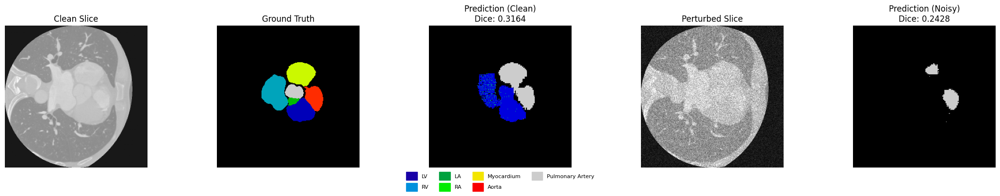

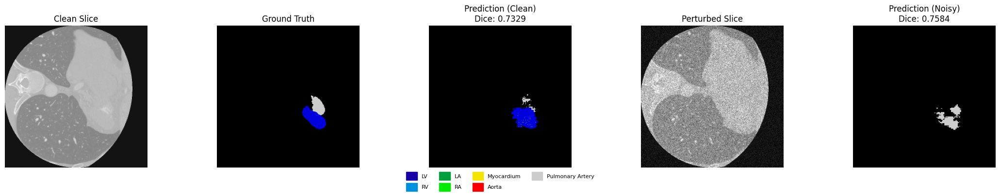

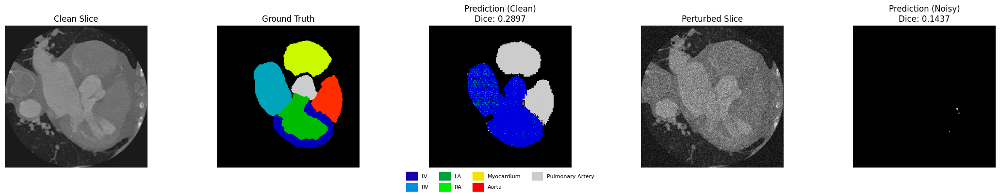

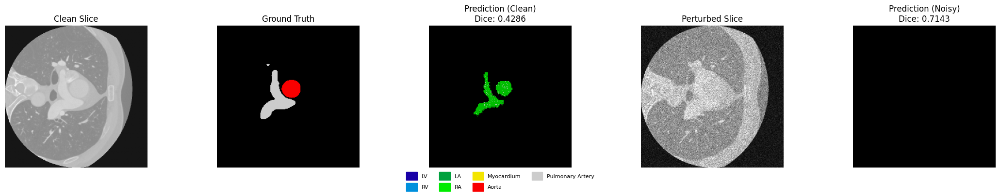

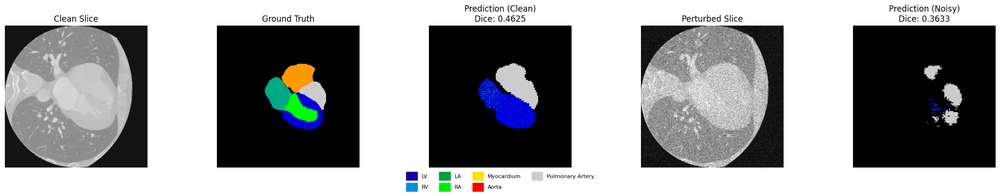

...

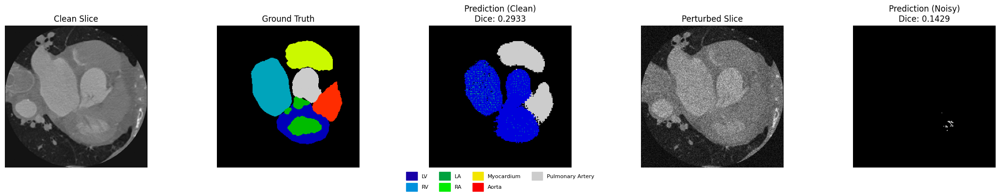

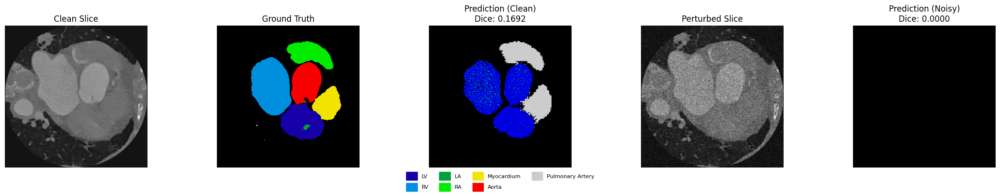

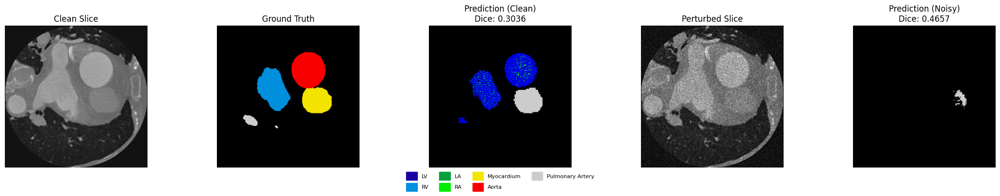

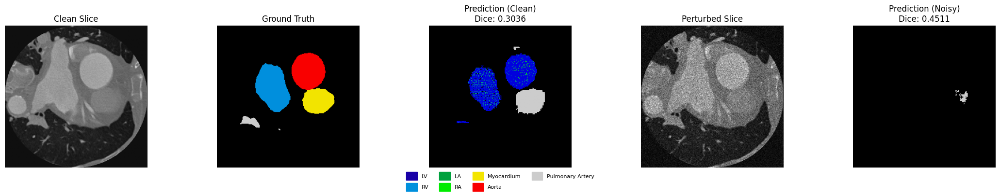

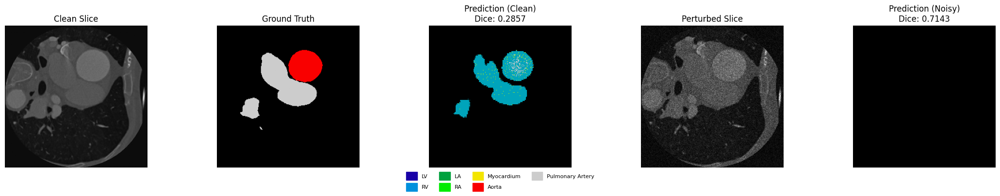

In [ ]:
fixed_indices = sample(range(len(test_dataset)), 20)

visualize_clean_vs_noisy_predictions(
    model=student,
    dataset=test_dataset,
    indices=fixed_indices,
    mode="noise3"
)

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from torch.utils.data import DataLoader
from tqdm import tqdm

def compute_dice_per_class(pred, target, num_classes):
    dices = []
    for cls in range(num_classes):
        pred_bin = (pred == cls).astype(np.uint8)
        target_bin = (target == cls).astype(np.uint8)
        intersection = np.sum(pred_bin * target_bin)
        union = np.sum(pred_bin) + np.sum(target_bin)
        dice = 2 * intersection / union if union else np.nan
        dices.append(dice)
    return dices

def compute_tri(model, dataset, mode="noise4", batch_size=16, num_classes=8):
    model.eval()
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    slice_wise_clean_dices = []
    slice_wise_noisy_dices = []
    per_class_clean_dice = [[] for _ in range(num_classes)]
    per_class_noisy_dice = [[] for _ in range(num_classes)]

    for images, masks in tqdm(loader, desc=f"Computing TRI"):
        images = images.cuda()
        masks = masks.cuda()

        # Apply noise to center slice
        noisy_images = images.clone().cpu().numpy()
        for i in range(len(noisy_images)):
            noisy_images[i][1] = simulate_clinical_noise(noisy_images[i][1], mode=mode)
        noisy_images = torch.tensor(noisy_images, dtype=torch.float32).cuda()

        with torch.no_grad():
            clean_logits, _, _ = model(images)
            noisy_logits, _, _ = model(noisy_images)

        pred_clean = torch.argmax(F.softmax(clean_logits, dim=1), dim=1).cpu().numpy()
        pred_noisy = torch.argmax(F.softmax(noisy_logits, dim=1), dim=1).cpu().numpy()
        masks_np = masks.cpu().numpy()

        for pc, pn, gt in zip(pred_clean, pred_noisy, masks_np):
            clean_dices = compute_dice_per_class(pc, gt, num_classes)
            noisy_dices = compute_dice_per_class(pn, gt, num_classes)

            slice_wise_clean_dices.append(np.nanmean(clean_dices[1:]))
            slice_wise_noisy_dices.append(np.nanmean(noisy_dices[1:]))

            for cls in range(1, num_classes):  # skip background
                if not np.isnan(clean_dices[cls]):
                    per_class_clean_dice[cls].append(clean_dices[cls])
                if not np.isnan(noisy_dices[cls]):
                    per_class_noisy_dice[cls].append(noisy_dices[cls])

    avg_clean = np.mean(slice_wise_clean_dices)
    avg_noisy = np.mean(slice_wise_noisy_dices)
    tri_score = avg_noisy / (avg_clean + 1e-8)

    label_names = ["Background", "LV", "RV", "LA", "RA", "Myocardium", "Aorta", "Pulmonary Artery"]
    print(f"\nPer-Class TRI (Clean vs Perturbed):")
    for i in range(1, num_classes):  # skip background
        c = np.mean(per_class_clean_dice[i]) if per_class_clean_dice[i] else 0
        n = np.mean(per_class_noisy_dice[i]) if per_class_noisy_dice[i] else 0
        tri = n / (c + 1e-8)
        print(f"  {label_names[i]:<20}: TRI = {tri:.4f} | Clean = {c:.4f} | Noisy = {n:.4f}")

    print(f"\nOverall Avg Dice:")
    print(f"Clean  = {avg_clean:.4f}")
    print(f"Noisy  = {avg_noisy:.4f}")
    print(f"TRI = {tri_score:.4f}")

    return tri_score, avg_clean, avg_noisy

In [ ]:
tri_score, clean_dice, noisy_dice = compute_tri(
    model=student,
    dataset=test_dataset,
    mode="noise3",  # or "noise1" to "noise10"
    batch_size=16
)

Computing TRI: 100%|██████████| 31/31 [00:08<00:00,  3.87it/s]


Per-Class TRI (Clean vs Perturbed):
  LV                  : TRI = 0.0179 | Clean = 0.3126 | Noisy = 0.0056
  RV                  : TRI = 0.0000 | Clean = 0.0745 | Noisy = 0.0000
  LA                  : TRI = 0.0000 | Clean = 0.0005 | Noisy = 0.0000
  RA                  : TRI = 0.0000 | Clean = 0.0000 | Noisy = 0.0000
  Myocardium          : TRI = 0.4207 | Clean = 0.5704 | Noisy = 0.2399
  Aorta               : TRI = 0.0000 | Clean = 0.0000 | Noisy = 0.0000
  Pulmonary Artery    : TRI = 0.0000 | Clean = 0.0000 | Noisy = 0.0000

Overall Avg Dice:
Clean  = 0.1713
Noisy  = 0.0415
TRI = 0.2423


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.utils.data import DataLoader


def compute_dice_per_class(pred, target, num_classes):
    dices = []
    for cls in range(num_classes):
        pred_bin = (pred == cls).astype(np.uint8)
        target_bin = (target == cls).astype(np.uint8)
        intersection = np.sum(pred_bin * target_bin)
        union = np.sum(pred_bin) + np.sum(target_bin)
        dice = 2 * intersection / union if union else np.nan
        dices.append(dice)
    return dices


def tri_curve_auc(model, dataset, batch_size=16, num_classes=8):
    noise_levels = [
        "noise1", "noise2", "noise3", "noise4", "noise5",
        "noise6", "noise7", "noise8", "noise9", "noise10"
    ]
    label_names = ["Background", "LV", "RV", "LA", "RA", "Myocardium", "Aorta", "Pulmonary Artery"]

    overall_tris = []
    per_class_tris = [[] for _ in range(num_classes)]

    clean_dice_baseline = None
    per_class_clean_baseline = None

    for mode in noise_levels:
        model.eval()
        clean_dices = []
        noisy_dices = []
        per_class_clean = [[] for _ in range(num_classes)]
        per_class_noisy = [[] for _ in range(num_classes)]

        loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)
        for images, masks in tqdm(loader, desc=f"Evaluating {mode}"):
            masks_np = masks.numpy()
            clean_inputs = images.clone().numpy()
            noisy_inputs = clean_inputs.copy()
            for b in range(len(noisy_inputs)):
                noisy_inputs[b][1] = simulate_clinical_noise(noisy_inputs[b][1], mode=mode)

            clean_tensor = torch.tensor(clean_inputs).cuda()
            noisy_tensor = torch.tensor(noisy_inputs).cuda()
            masks = masks.cuda()

            with torch.no_grad():
                logits_clean, _, _ = model(clean_tensor)
                logits_noisy, _, _ = model(noisy_tensor)

            pred_clean = torch.argmax(F.softmax(logits_clean, dim=1), dim=1).cpu().numpy()
            pred_noisy = torch.argmax(F.softmax(logits_noisy, dim=1), dim=1).cpu().numpy()

            for pc, pn, gt in zip(pred_clean, pred_noisy, masks_np):
                clean_per_class = compute_dice_per_class(pc, gt, num_classes)
                noisy_per_class = compute_dice_per_class(pn, gt, num_classes)
                clean_dices.append(np.nanmean(clean_per_class[1:]))
                noisy_dices.append(np.nanmean(noisy_per_class[1:]))
                for cls in range(1, num_classes):
                    if not np.isnan(clean_per_class[cls]):
                        per_class_clean[cls].append(clean_per_class[cls])
                    if not np.isnan(noisy_per_class[cls]):
                        per_class_noisy[cls].append(noisy_per_class[cls])

        avg_clean = np.mean(clean_dices)
        avg_noisy = np.mean(noisy_dices)
        overall_tri = avg_noisy / (avg_clean + 1e-8)
        overall_tris.append(overall_tri)

        if per_class_clean_baseline is None:
            per_class_clean_baseline = [np.mean(per_class_clean[c]) for c in range(1, num_classes)]

        for cls in range(1, num_classes):
            clean_avg = np.mean(per_class_clean[cls])
            noisy_avg = np.mean(per_class_noisy[cls])
            tri = noisy_avg / (clean_avg + 1e-8)
            per_class_tris[cls].append(tri)

        print(f"{mode} → Clean Dice: {avg_clean:.4f}, Noisy Dice: {avg_noisy:.4f}, TRI: {overall_tri:.4f}")

    # Plot TRI Curve
    plt.figure(figsize=(10, 5))
    plt.plot(noise_levels, overall_tris, marker='o', label="Overall TRI", color='black')
    plt.ylim(0, 1.05)
    plt.title("TRI Curve - Overall")
    plt.xlabel("Severity Level of Perturbed Image")
    plt.ylabel("TRI")
    plt.grid(True)
    plt.legend()
    plt.show()

    # Plot Per-Class TRI Curves
    plt.figure(figsize=(12, 6))
    for cls in range(1, num_classes):
        plt.plot(noise_levels, per_class_tris[cls], marker='o', label=label_names[cls])

    plt.ylim(0, 1.05)
    plt.title("TRI Curve - Per Class")
    plt.xlabel("Severity Level of Perturbed Image")
    plt.ylabel("TRI")
    plt.grid(True)
    plt.legend()
    plt.show()

    auc_overall = np.mean(overall_tris)
    print(f"\nAUC-TRI (Overall): {auc_overall:.4f}")
    return auc_overall, overall_tris, per_class_tris

Evaluating noise1: 100%|██████████| 31/31 [00:07<00:00,  3.90it/s]


noise1 → Clean Dice: 0.1713, Noisy Dice: 0.0439, TRI: 0.2563


Evaluating noise2: 100%|██████████| 31/31 [00:08<00:00,  3.80it/s]


noise2 → Clean Dice: 0.1713, Noisy Dice: 0.0428, TRI: 0.2497


Evaluating noise3: 100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


noise3 → Clean Dice: 0.1713, Noisy Dice: 0.0415, TRI: 0.2425


Evaluating noise4: 100%|██████████| 31/31 [00:08<00:00,  3.85it/s]


noise4 → Clean Dice: 0.1713, Noisy Dice: 0.0391, TRI: 0.2285


Evaluating noise5: 100%|██████████| 31/31 [00:07<00:00,  3.88it/s]


noise5 → Clean Dice: 0.1713, Noisy Dice: 0.0367, TRI: 0.2143


Evaluating noise6: 100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


noise6 → Clean Dice: 0.1713, Noisy Dice: 0.0343, TRI: 0.2002


Evaluating noise7: 100%|██████████| 31/31 [00:08<00:00,  3.87it/s]


noise7 → Clean Dice: 0.1713, Noisy Dice: 0.0297, TRI: 0.1733


Evaluating noise8: 100%|██████████| 31/31 [00:07<00:00,  3.89it/s]


noise8 → Clean Dice: 0.1713, Noisy Dice: 0.0226, TRI: 0.1320


Evaluating noise9: 100%|██████████| 31/31 [00:07<00:00,  4.09it/s]


noise9 → Clean Dice: 0.1713, Noisy Dice: 0.0125, TRI: 0.0732


Evaluating noise10: 100%|██████████| 31/31 [00:07<00:00,  4.39it/s]


noise10 → Clean Dice: 0.1713, Noisy Dice: 0.0012, TRI: 0.0071


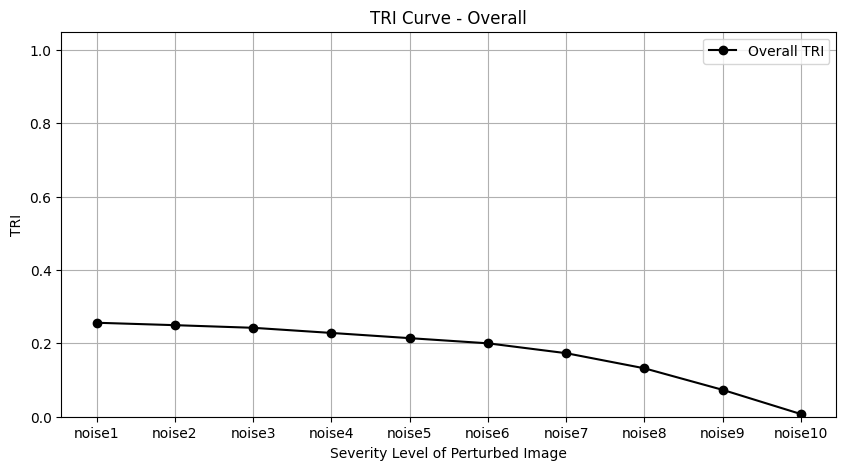

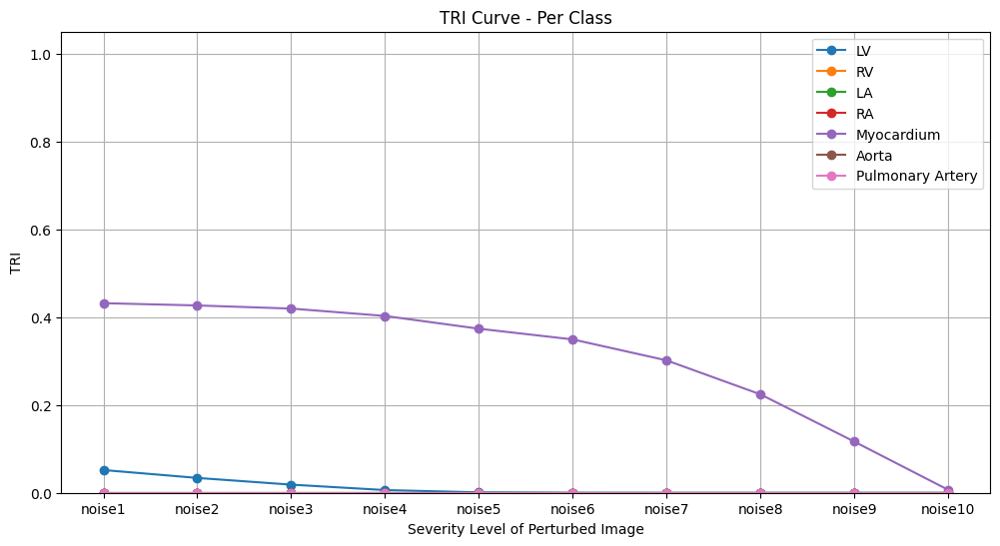


AUC-TRI (Overall): 0.1777


In [ ]:
auc_tri, overall_tris, per_class_tris = tri_curve_auc(
    model=student,
    dataset=test_dataset,
    batch_size=16,
    num_classes=8
)